## Description 
This notebook provides key visualizations of results of remote work estimation and bring insights for calculation improvement

In [6]:
import os
import geopandas as gpd
import pandas as pd
import sys
import seaborn as sns
# Add project root to Python path
project_root = "/Users/inessat/Documents/phd/empirics/israel/notebooks/phd-remote-work"
if project_root not in sys.path:
    sys.path.append(project_root)

from geofunctions import utils
import matplotlib.pyplot as plt

In [83]:
months = utils.return_list_months_ok()
list_months = []
for MONTH in months:
    print(MONTH)
    try:
        df_part = pd.read_csv(
            utils.get_path(
                "processed", "dwells", f"remote_work/user_remote_work_{MONTH}.csv"
            )
        )
        df_part["month"] = MONTH
        list_months.append(df_part)
    except:
        pass

201901
201904
201907
201908
201909
201910
201911
202001
202002
202003
202004
202005
202006
202007
202008
202009
202010
202011
202101
202102
202103
202104
202105
202106
202107
202108
202109
202110
202111
202112
202201
202202
202203
202204
202205
202206
202207
202208
202209
202210
202211
202301
202302
202303
202304
202305
202306
202309


In [84]:
df_shares = pd.concat(list_months)

In [85]:
df_shares=df_shares[df_shares.month!='202206']
df_shares = df_shares.iloc[:,:-7]

## ColumnsDescription:
* total_work_days - days when specific user had work hours ( probability to be at work higher than to be at any other place)

In [86]:
df_shares.head()

,Unnamed: 0,identifier,identifier_type,remote_work_days,total_work_days,remote_work_days_smooth,remote_work_days_min_work,remote_work_share,remote_work_share_smooth,remote_work_share_min_work,month
0,0.0,003b6189-ca3d-46e8-91aa-f9c271a8826e,GAID,5.0,12.0,5.0,3.0,0.416667,0.416667,0.250000,201901
1,1.0,0051f3fc-32d7-4686-ac58-214c62d6efd5,IDFA,2.0,20.0,5.0,2.0,0.100000,0.250000,0.100000,201901
2,2.0,0052e839-ea74-4c11-9c4a-2527e12126ff,IDFA,3.0,15.0,8.0,7.0,0.200000,0.533333,0.466667,201901
3,3.0,00596205-d7d0-4067-ae1b-dbe358625f14,IDFA,4.0,22.0,13.0,11.0,0.181818,0.590909,0.500000,201901
4,4.0,005aaa4a-588c-4390-bd1d-224e06e9d2d2,IDFA,9.0,15.0,9.0,9.0,0.600000,0.600000,0.600000,201901


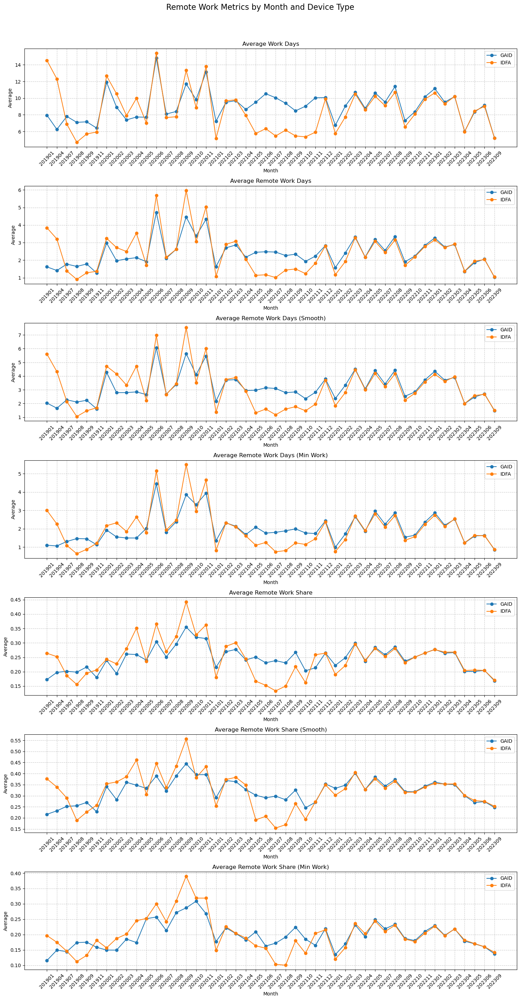


Detailed Statistics:
     month identifier_type  total_work_days  remote_work_days  remote_work_days_smooth  remote_work_days_min_work  remote_work_share  remote_work_share_smooth  remote_work_share_min_work
0   201901            GAID            7.953             1.620                    2.033                      1.103              0.173                     0.216                       0.115
1   201901            IDFA           14.531             3.845                    5.604                      2.999              0.264                     0.376                       0.197
2   201904            GAID            6.252             1.412                    1.659                      1.067              0.198                     0.232                       0.149
3   201904            IDFA           12.305             3.208                    4.322                      2.261              0.252                     0.339                       0.175
4   201907            GAID            7.808

In [87]:
import seaborn as sns
# Calculate averages for all numeric columns
avg_by_month_type = df_shares.groupby(['month', 'identifier_type']).agg({
    'total_work_days': 'mean',
    'remote_work_days': 'mean',
    'remote_work_days_smooth': 'mean',
    'remote_work_days_min_work': 'mean',
    'remote_work_share': 'mean',
    'remote_work_share_smooth': 'mean',
    'remote_work_share_min_work': 'mean'
}).reset_index()

# Create visualization for all metrics
metrics = [
    ('total_work_days', 'Average Work Days'),
    ('remote_work_days', 'Average Remote Work Days'),
    ('remote_work_days_smooth', 'Average Remote Work Days (Smooth)'),
    ('remote_work_days_min_work', 'Average Remote Work Days (Min Work)'),
    ('remote_work_share', 'Average Remote Work Share'),
    ('remote_work_share_smooth', 'Average Remote Work Share (Smooth)'),
    ('remote_work_share_min_work', 'Average Remote Work Share (Min Work)')
]

fig, axes = plt.subplots(len(metrics), 1, figsize=(15, 4*len(metrics)))
fig.suptitle('Remote Work Metrics by Month and Device Type', fontsize=16, y=1.02)

for i, (metric, title) in enumerate(metrics):
    for device_type in avg_by_month_type['identifier_type'].unique():
        data = avg_by_month_type[avg_by_month_type['identifier_type'] == device_type]
        axes[i].plot(data['month'], data[metric], marker='o', label=device_type)
    
    axes[i].set_title(title)
    axes[i].set_xlabel('Month')
    axes[i].set_ylabel('Average')
    axes[i].grid(True, linestyle='--', alpha=0.7)
    axes[i].legend()
    axes[i].tick_params(axis='x', rotation=45)
    
plt.tight_layout()
plt.show()

# Print detailed statistics
print("\nDetailed Statistics:")
print(avg_by_month_type.round(3).to_string())

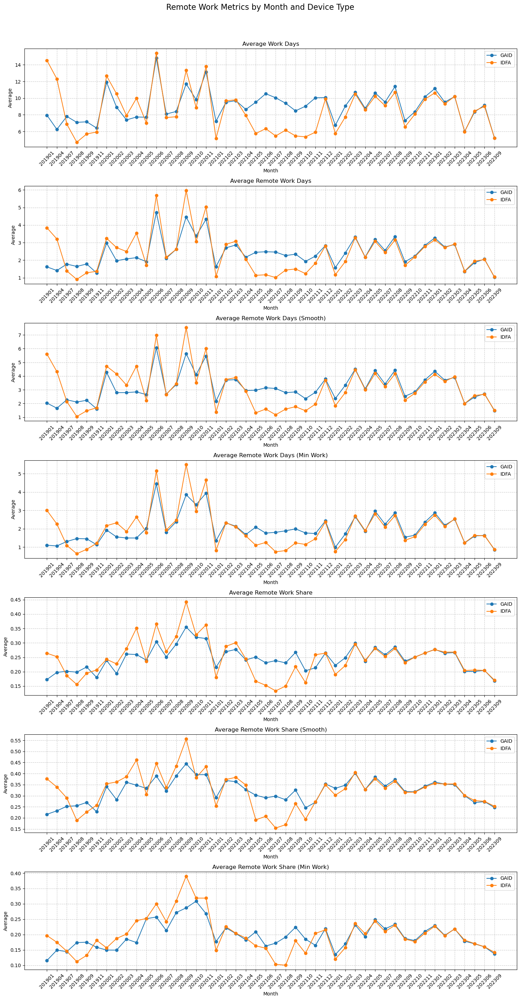


Detailed Statistics:
     month identifier_type  total_work_days  remote_work_days  remote_work_days_smooth  remote_work_days_min_work  remote_work_share  remote_work_share_smooth  remote_work_share_min_work
0   201901            GAID            7.953             1.620                    2.033                      1.103              0.173                     0.216                       0.115
1   201901            IDFA           14.531             3.845                    5.604                      2.999              0.264                     0.376                       0.197
2   201904            GAID            6.252             1.412                    1.659                      1.067              0.198                     0.232                       0.149
3   201904            IDFA           12.305             3.208                    4.322                      2.261              0.252                     0.339                       0.175
4   201907            GAID            7.808

In [ ]:
import seaborn as sns
# Calculate averages for all numeric columns
avg_by_month_type = df_shares.groupby(['month', 'identifier_type']).agg({
    'total_work_days': 'mean',
    'remote_work_days': 'mean',
    'remote_work_days_smooth': 'mean',
    'remote_work_days_min_work': 'mean',
    'remote_work_share': 'mean',
    'remote_work_share_smooth': 'mean',
    'remote_work_share_min_work': 'mean'
}).reset_index()

# Create visualization for all metrics
metrics = [
    ('total_work_days', 'Average Work Days'),
    ('remote_work_days', 'Average Remote Work Days'),
    ('remote_work_days_smooth', 'Average Remote Work Days (Smooth)'),
    ('remote_work_days_min_work', 'Average Remote Work Days (Min Work)'),
    ('remote_work_share', 'Average Remote Work Share'),
    ('remote_work_share_smooth', 'Average Remote Work Share (Smooth)'),
    ('remote_work_share_min_work', 'Average Remote Work Share (Min Work)')
]

fig, axes = plt.subplots(len(metrics), 1, figsize=(15, 4*len(metrics)))
fig.suptitle('Remote Work Metrics by Month and Device Type', fontsize=16, y=1.02)

for i, (metric, title) in enumerate(metrics):
    for device_type in avg_by_month_type['identifier_type'].unique():
        data = avg_by_month_type[avg_by_month_type['identifier_type'] == device_type]
        axes[i].plot(data['month'], data[metric], marker='o', label=device_type)
    
    axes[i].set_title(title)
    axes[i].set_xlabel('Month')
    axes[i].set_ylabel('Average')
    axes[i].grid(True, linestyle='--', alpha=0.7)
    axes[i].legend()
    axes[i].tick_params(axis='x', rotation=45)
    
plt.tight_layout()
plt.show()

# Print detailed statistics
print("\nDetailed Statistics:")
print(avg_by_month_type.round(3).to_string())

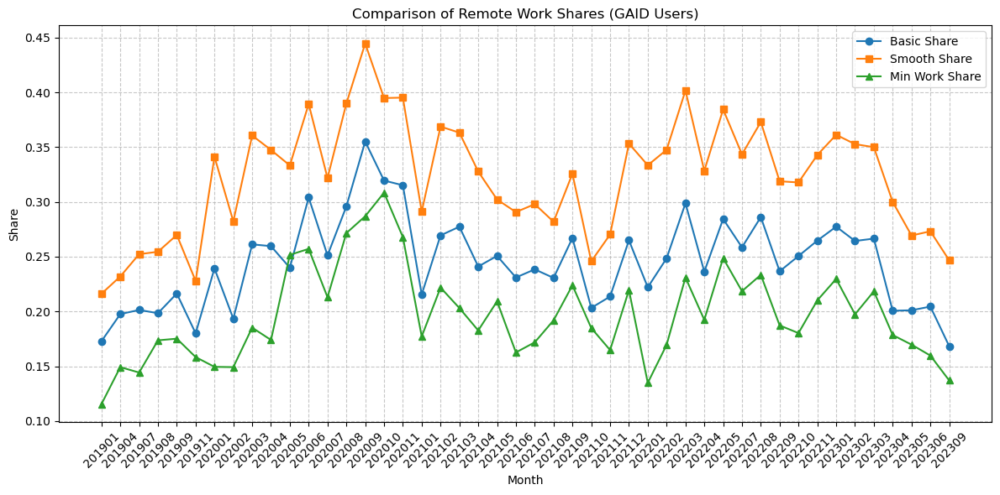


Detailed Statistics for GAID Users:
     month  remote_work_share  remote_work_share_smooth  remote_work_share_min_work
0   201901              0.173                     0.216                       0.115
1   201904              0.198                     0.232                       0.149
2   201907              0.201                     0.252                       0.144
3   201908              0.198                     0.255                       0.174
4   201909              0.216                     0.270                       0.175
5   201911              0.180                     0.228                       0.158
6   202001              0.239                     0.341                       0.149
7   202002              0.193                     0.282                       0.149
8   202003              0.261                     0.361                       0.185
9   202004              0.260                     0.347                       0.174
10  202005              0.240          

In [88]:
# Filter for GAID and calculate averages
avg_by_month_gaid = df_shares[(df_shares['identifier_type'] == 'GAID')].groupby('month').agg({
    'remote_work_share': 'mean',
    'remote_work_share_smooth': 'mean',
    'remote_work_share_min_work': 'mean'
}).reset_index()

# Create single plot comparing all share metrics
plt.figure(figsize=(12, 6))

# Plot each share metric
plt.plot(avg_by_month_gaid['month'], 
         avg_by_month_gaid['remote_work_share'], 
         marker='o', 
         label='Basic Share')
plt.plot(avg_by_month_gaid['month'], 
         avg_by_month_gaid['remote_work_share_smooth'], 
         marker='s', 
         label='Smooth Share')
plt.plot(avg_by_month_gaid['month'], 
         avg_by_month_gaid['remote_work_share_min_work'], 
         marker='^', 
         label='Min Work Share')

plt.title('Comparison of Remote Work Shares (GAID Users)', fontsize=12)
plt.xlabel('Month')
plt.ylabel('Share')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

# Print detailed statistics
print("\nDetailed Statistics for GAID Users:")
print(avg_by_month_gaid.round(3).to_string())

# Statistic by date and month

In [2]:
months = utils.return_list_months_ok()
list_months_dates = []
for MONTH in months:
    print(MONTH)
    try:
        df_part = pd.read_csv(
            utils.get_path(
                "processed", "dwells", f"remote_work/remote_work_stats_hour_date_{MONTH}.csv"
            )
        )
        df_part["month"] = MONTH
        print(df_part.shape)
        list_months_dates.append(df_part)
    except:
        pass

201901
(1500, 8)
201904
(1449, 8)
201907
(1499, 8)
201908
(1490, 8)
201909
(1436, 8)
201910
201911
(1428, 8)
202001
(1500, 8)
202002
(1403, 8)
202003
(1488, 8)
202004
(1449, 8)
202005
(1502, 8)
202006
(1440, 8)
202007
(1501, 8)
202008
(1499, 8)
202009
(1436, 8)
202010
(1491, 8)
202011
(1451, 8)
202101
(1498, 8)
202102
(1356, 8)
202103
(1469, 8)
202104
(1449, 8)
202105
(1463, 8)
202106
(1358, 8)
202107
(1418, 8)
202108
(1315, 8)
202109
(1228, 8)
202110
(1354, 8)
202111
(1208, 8)
202112
(1486, 8)
202201
(1118, 8)
202202
(1355, 8)
202203
(1426, 8)
202204
(1454, 8)
202205
(1490, 8)
202206
202207
(1478, 8)
202208
(1501, 8)
202209
(1436, 8)
202210
(1496, 8)
202211
(1452, 8)
202301
(1500, 8)
202302
(1356, 8)
202303
(1485, 8)
202304
(1449, 8)
202305
(1478, 8)
202306
(1440, 8)
202309
(1285, 8)


In [4]:
df_shares_dates = pd.concat(list_months_dates)

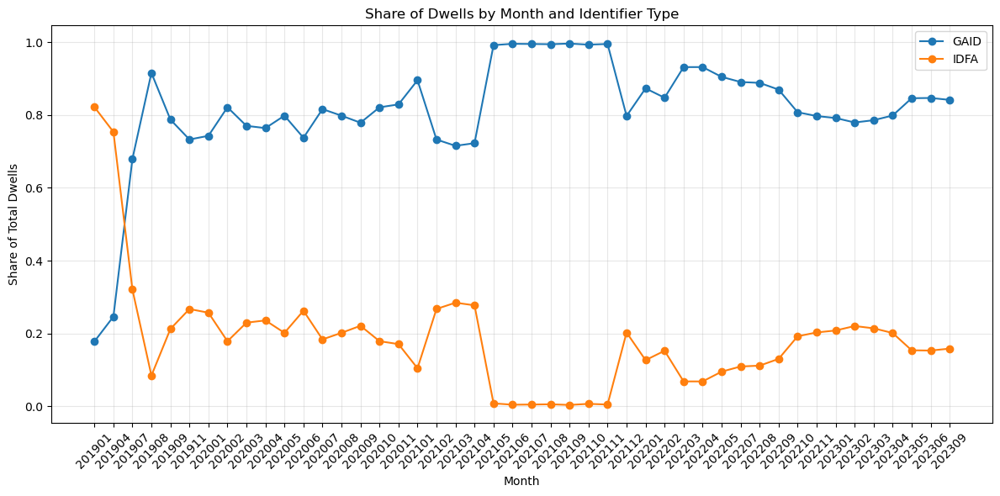

In [91]:
# Group by month and identifier type to get total count_dwells
monthly_counts = df_shares_dates.groupby(['month', 'identifier_type'])['count_dwells'].sum().reset_index()

# Calculate total counts per month to get shares
monthly_totals = monthly_counts.groupby('month')['count_dwells'].sum().reset_index()
monthly_counts = monthly_counts.merge(monthly_totals, on='month', suffixes=('', '_total'))
monthly_counts['share'] = monthly_counts['count_dwells'] / monthly_counts['count_dwells_total']

# Create plot
plt.figure(figsize=(12, 6))

# Plot lines for each identifier type
for id_type in monthly_counts['identifier_type'].unique():
    data = monthly_counts[monthly_counts['identifier_type'] == id_type]
    plt.plot(data['month'], data['share'], marker='o', label=id_type)

plt.title('Share of Dwells by Month and Identifier Type')
plt.xlabel('Month')
plt.ylabel('Share of Total Dwells')
plt.xticks(rotation=45)
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

In [92]:
df_shares_dates[(df_shares_dates['month']=='202304')]

,Unnamed: 0,date,hour,identifier_type,flag_remote_work,flag_work_hours,count_dwells,month
0,0,2023-04-01,0,GAID,0,0,949,202304
1,1,2023-04-01,0,IDFA,0,0,220,202304
2,2,2023-04-01,1,GAID,0,0,472,202304
3,3,2023-04-01,1,IDFA,0,0,108,202304
4,4,2023-04-01,2,GAID,0,0,231,202304
...,...,...,...,...,...,...,...,...
1444,1444,2023-05-01,4,GAID,0,10,96,202304
1445,1445,2023-05-01,4,IDFA,0,2,17,202304
1446,1446,2023-05-01,5,GAID,0,1,42,202304
1447,1447,2023-05-01,5,IDFA,0,1,11,202304


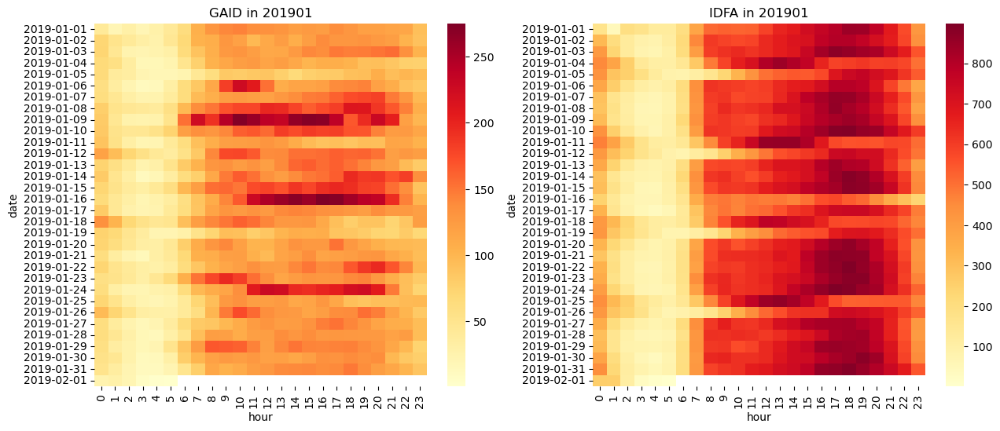

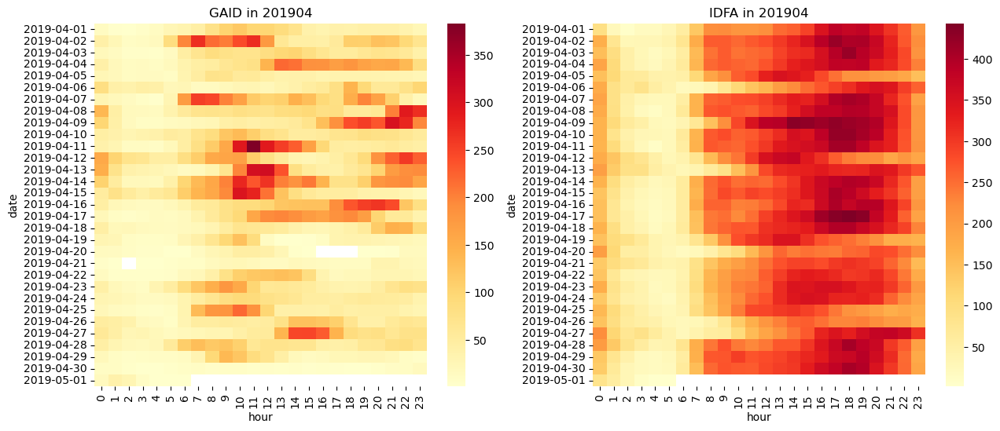

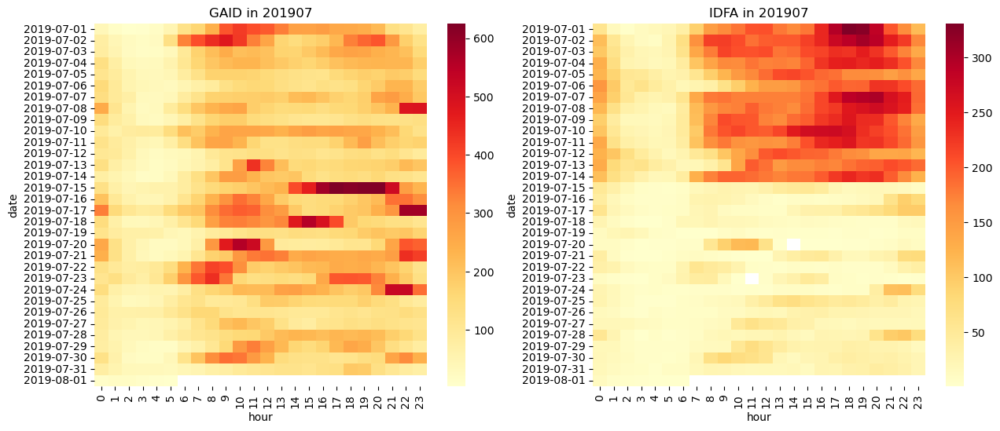

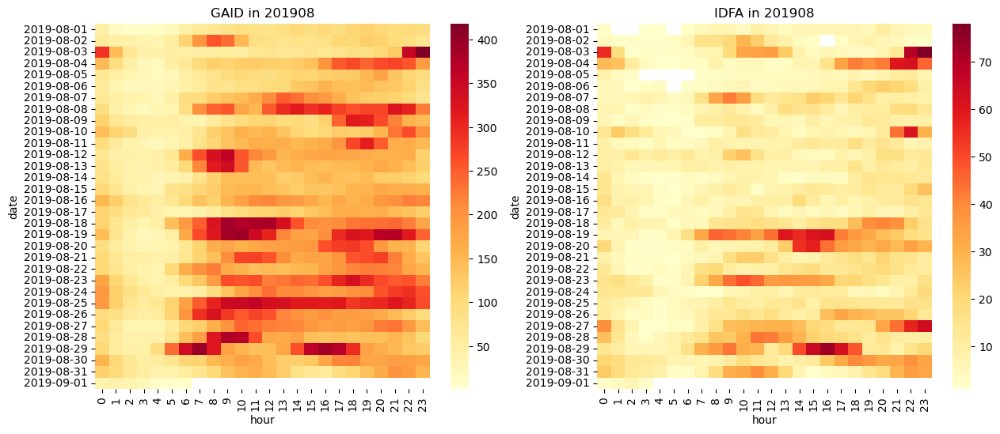

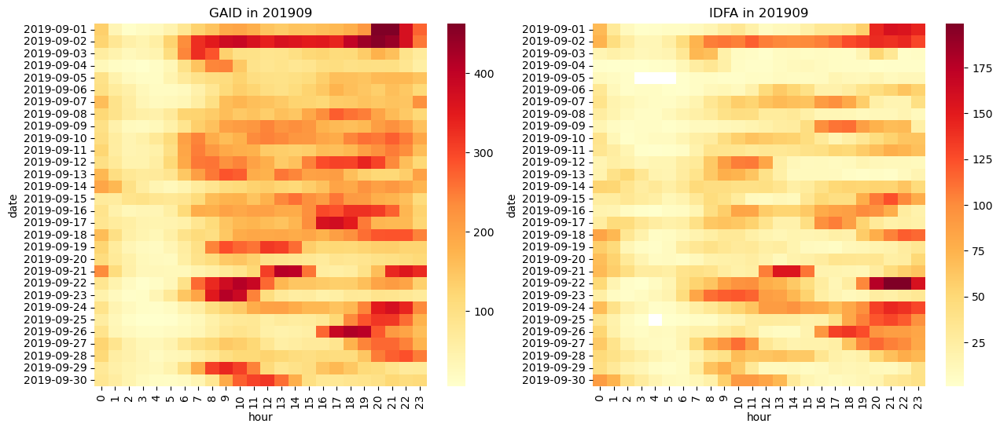

...

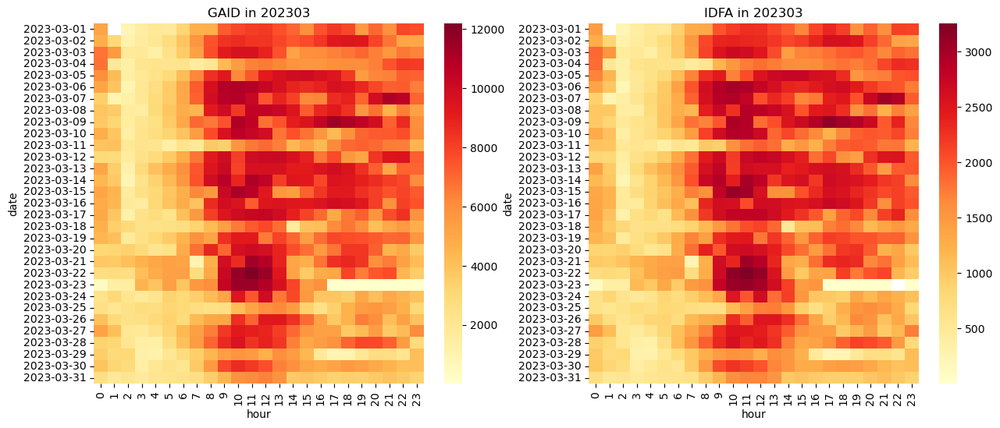

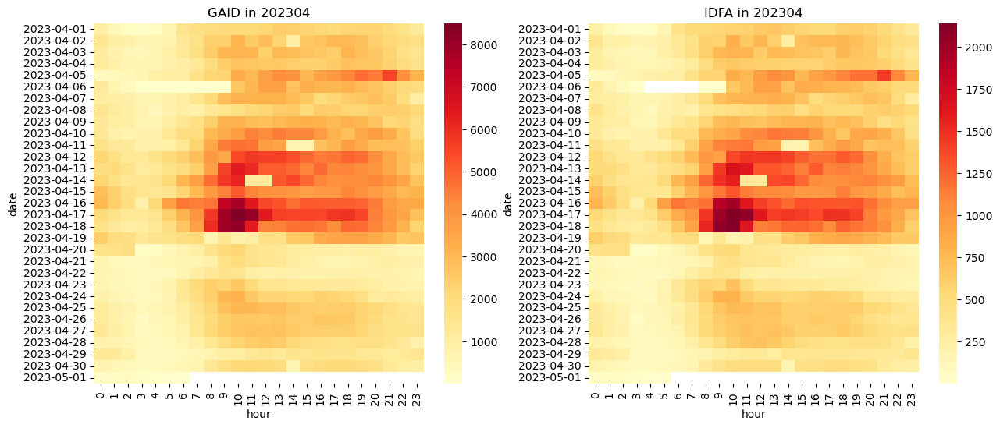

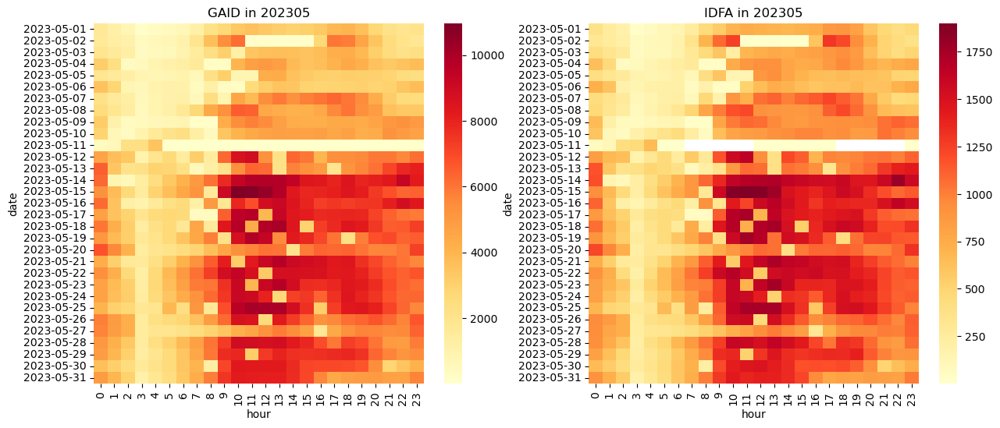

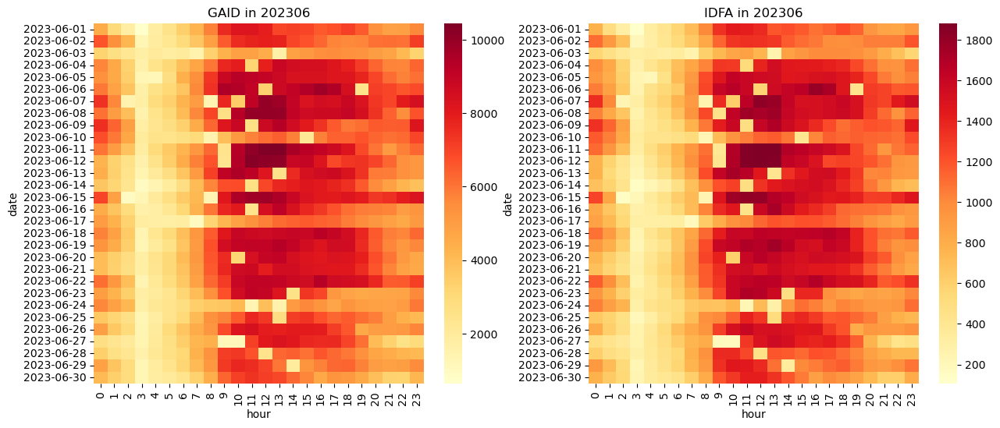

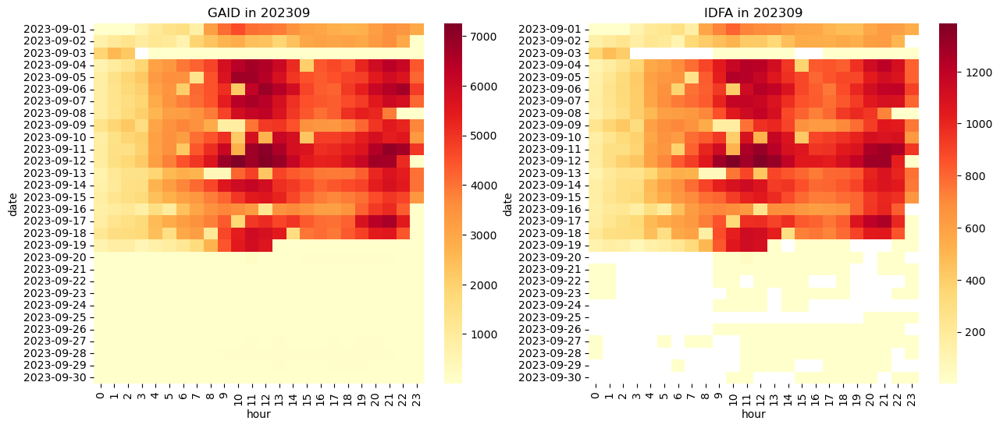

In [7]:
for MONTH in df_shares_dates['month'].unique():
    
    # Plot heatmap for GAID
    plt.figure(figsize=(15, 6))
    plt.subplot(1, 2, 1)
    sns.heatmap(pd.pivot(df_shares_dates[(df_shares_dates['month']==MONTH) & 
                                       (df_shares_dates['identifier_type']=='GAID')]
                        , index="date", columns="hour", values="count_dwells"), cmap="YlOrRd")
    plt.title(f'GAID in {MONTH}')
    
    # Plot heatmap for IDFA
    plt.subplot(1, 2, 2)
    sns.heatmap(pd.pivot(df_shares_dates[(df_shares_dates['month']==MONTH) & 
                                       (df_shares_dates['identifier_type']=='IDFA')]
                        , index="date", columns="hour", values="count_dwells"), cmap="YlOrRd")
    plt.title(f'IDFA in {MONTH}')
    plt.show()

In [94]:
df_shares_dates["share_remote_work"] = df_shares_dates["flag_remote_work"]/df_shares_dates["flag_work_hours"]

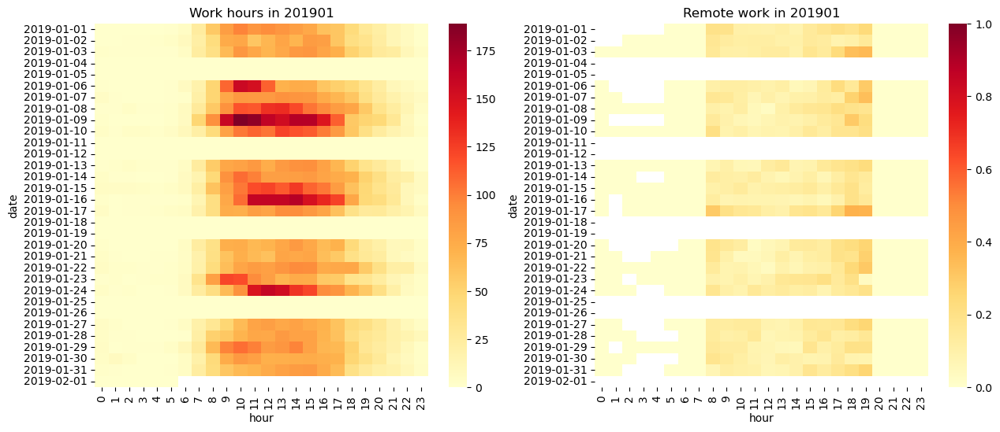

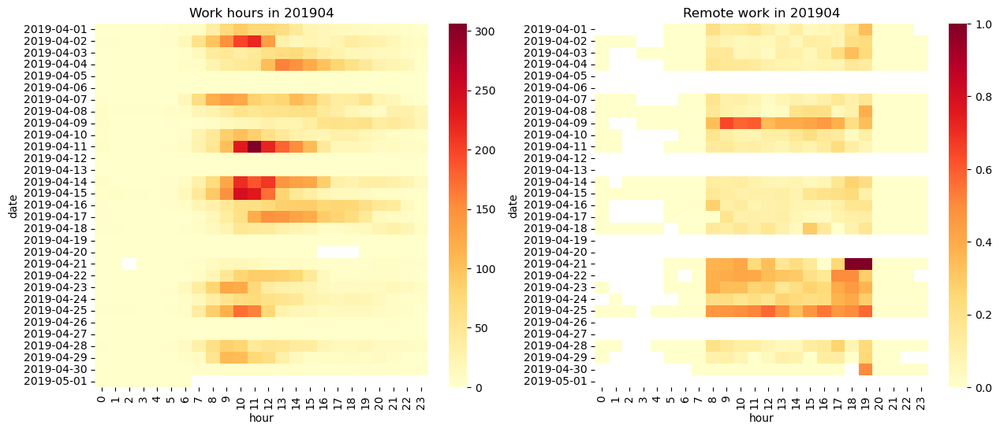

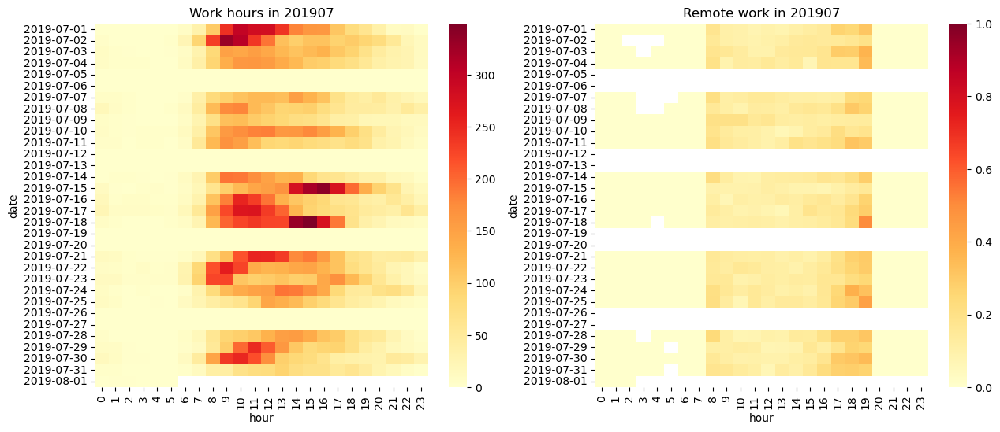

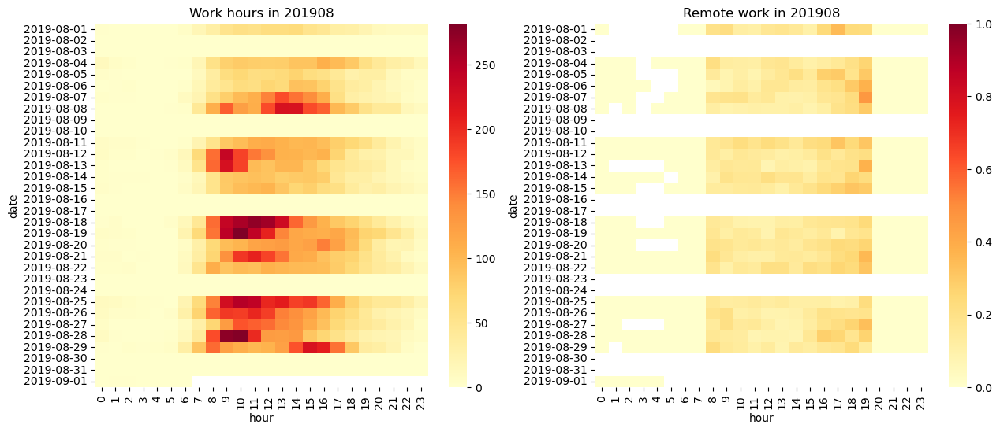

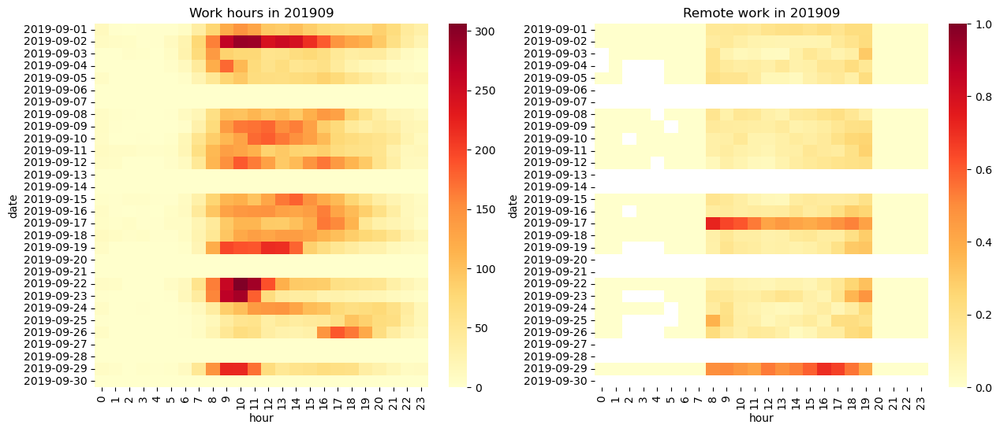

...

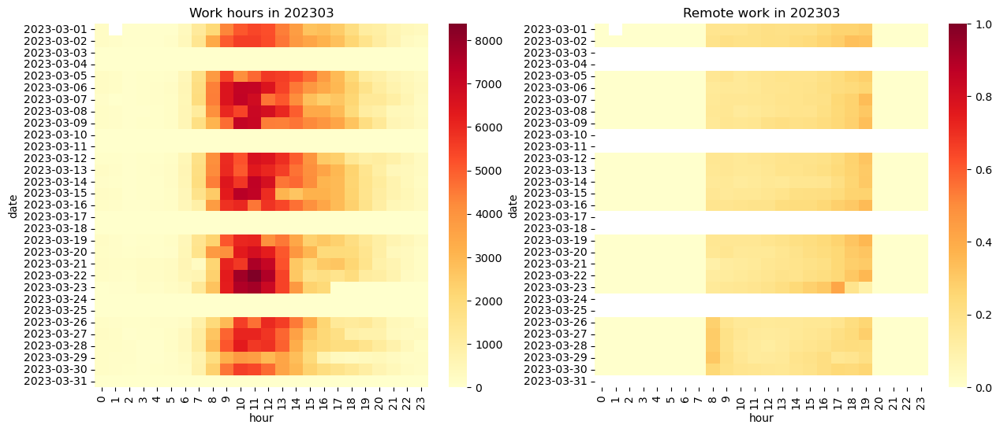

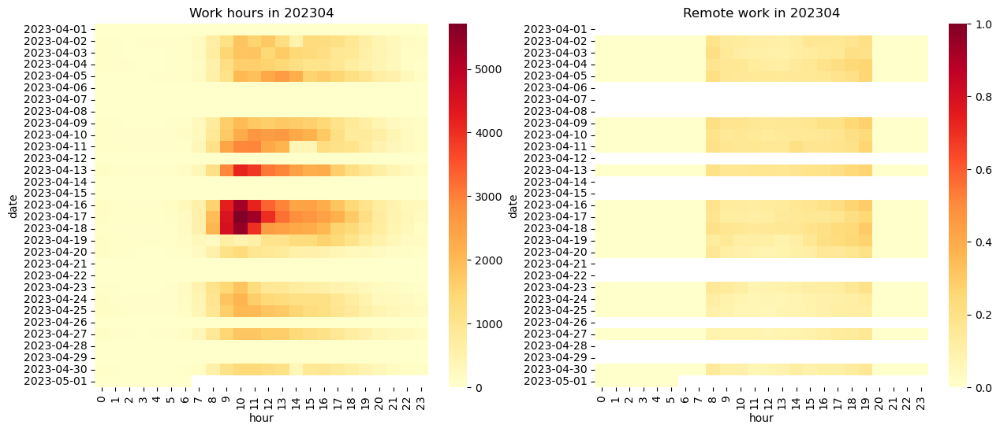

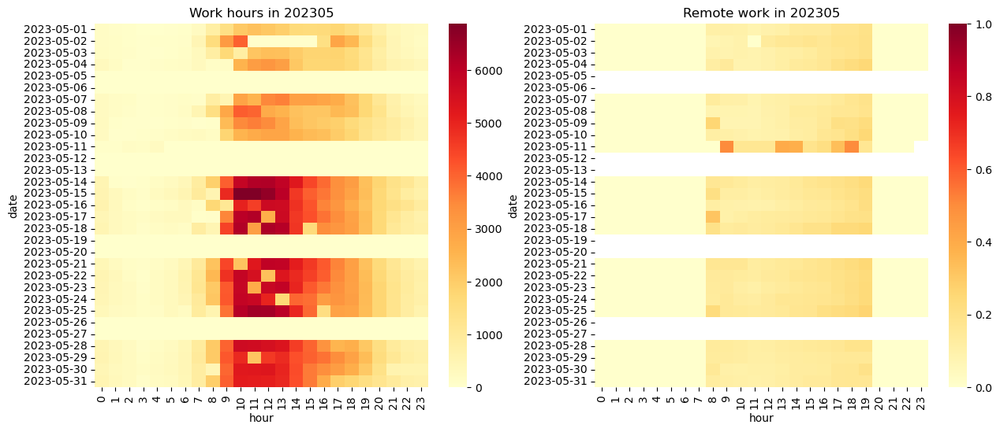

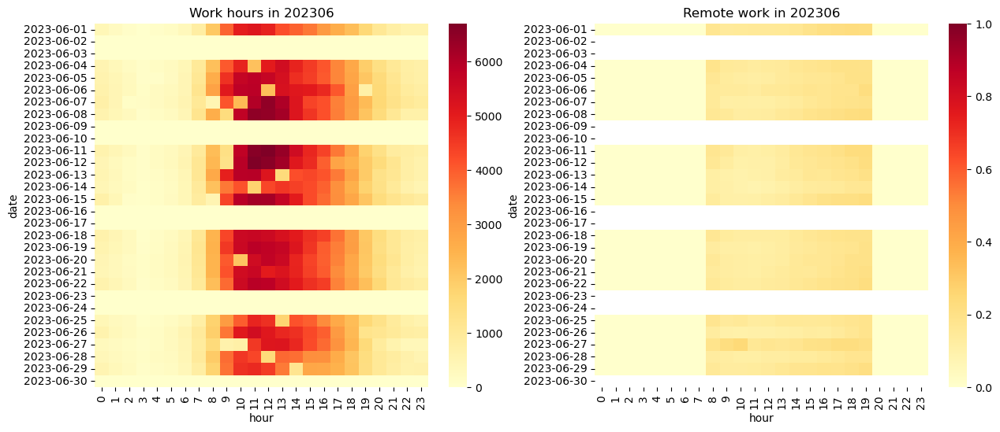

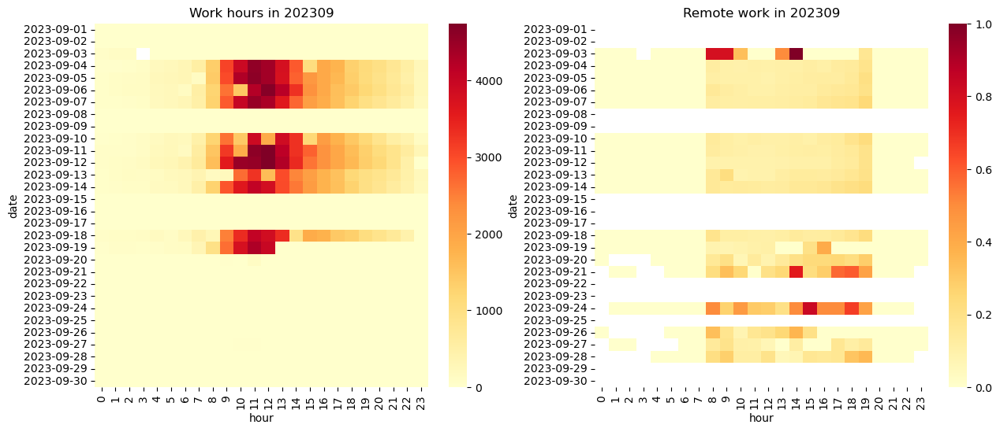

In [95]:
import seaborn as sns
for MONTH in df_shares_dates['month'].unique():
    
    # Plot heatmap for GAID
    plt.figure(figsize=(15, 6))
    plt.subplot(1, 2, 1)
    sns.heatmap(pd.pivot(df_shares_dates[(df_shares_dates['month']==MONTH) & 
                                       (df_shares_dates['identifier_type']=='GAID')]
                        , index="date", columns="hour", values="flag_work_hours"), cmap="YlOrRd")
    plt.title(f'Work hours in {MONTH}')
    
    # Plot heatmap for IDFA
    plt.subplot(1, 2, 2)
    sns.heatmap(pd.pivot(df_shares_dates[(df_shares_dates['month']==MONTH) & 
                                       (df_shares_dates['identifier_type']=='GAID')]
                        , index="date", columns="hour", values="share_remote_work"), cmap="YlOrRd", vmax=1)
    plt.title(f'Remote work in {MONTH}')
    plt.show()

In [8]:
plt.figure(figsize=(12, 6))

# Plotting the data
plt.plot(
    df.index,
    df["Filtered Users"],
    linewidth=2,
    marker="o",
    markersize=5,
    label="Filtered Users",
)

# Adding the horizontal red line
plt.axhline(
    y=10000, color="red", linestyle="--", linewidth=2, label="Threshold (10,000)"
)

# Adding title and labels
plt.title("Monthly Filtered Users Dynamics", fontsize=16, fontweight="bold")
plt.xlabel("Month", fontsize=12)
plt.ylabel("Filtered Users", fontsize=12)

# Adding grid and improving visuals
plt.grid(True, linestyle="--", alpha=0.6)
plt.xticks(rotation=45, fontsize=10)
plt.yticks(fontsize=10)

# Adding legend
plt.legend(fontsize=10)

# Adjusting layout
plt.tight_layout()

# Display the plot
plt.show()

NameError: name 'df' is not defined

<Figure size 1200x600 with 0 Axes>

In [22]:
excluded_months = ["201904", 
                   "201911", 
                   "202005", "202007", "202008", "202101",
                   "202110", #because of low corr of home locations with population
                     "202201", "202309", "202010"]

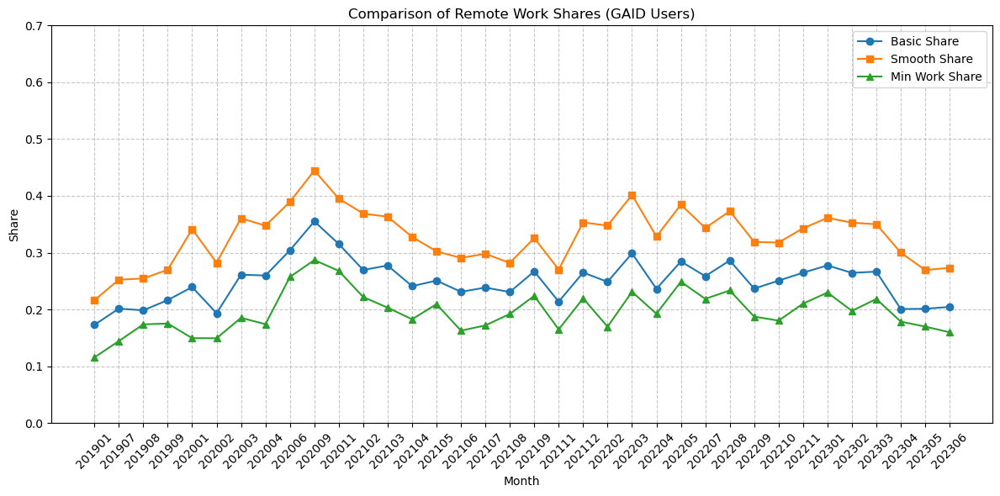


Detailed Statistics for GAID Users:
     month  remote_work_share  remote_work_share_smooth  remote_work_share_min_work
0   201901              0.173                     0.216                       0.115
1   201907              0.201                     0.252                       0.144
2   201908              0.198                     0.255                       0.174
3   201909              0.216                     0.270                       0.175
4   202001              0.239                     0.341                       0.149
5   202002              0.193                     0.282                       0.149
6   202003              0.261                     0.361                       0.185
7   202004              0.260                     0.347                       0.174
8   202006              0.304                     0.389                       0.257
9   202009              0.355                     0.445                       0.287
10  202011              0.315          

In [25]:
# Filter for GAID and calculate averages
avg_by_month_gaid = df_shares[(df_shares['identifier_type'] == 'GAID')&(~df_shares['month'].isin(excluded_months))].groupby('month').agg({
    'remote_work_share': 'mean',
    'remote_work_share_smooth': 'mean',
    'remote_work_share_min_work': 'mean'
}).reset_index()

# Create single plot comparing all share metrics
plt.figure(figsize=(12, 6))

# Plot each share metric
plt.plot(avg_by_month_gaid['month'], 
         avg_by_month_gaid['remote_work_share'], 
         marker='o', 
         label='Basic Share')
plt.plot(avg_by_month_gaid['month'], 
         avg_by_month_gaid['remote_work_share_smooth'], 
         marker='s', 
         label='Smooth Share')
plt.plot(avg_by_month_gaid['month'], 
         avg_by_month_gaid['remote_work_share_min_work'], 
         marker='^', 
         label='Min Work Share')

plt.title('Comparison of Remote Work Shares (GAID Users)', fontsize=12)
plt.xlabel('Month')
plt.ylabel('Share')
plt.grid(True, linestyle='--', alpha=0.7)
plt.ylim(0, 0.7)
plt.legend()
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

# Print detailed statistics
print("\nDetailed Statistics for GAID Users:")
print(avg_by_month_gaid.round(3).to_string())

In [ ]:
for MONTH in df_shares_dates['month'].unique():
    
    # Plot heatmap for GAID
    plt.figure(figsize=(15, 6))
    plt.subplot(1, 2, 1)
    sns.heatmap(pd.pivot(df_shares_dates[(df_shares_dates['month']==MONTH) & 
                                       (df_shares_dates['identifier_type']=='GAID')]
                        , index="date", columns="hour", values="count_dwells"), cmap="YlOrRd")
    plt.title(f'GAID in {MONTH}')
    
    # Plot heatmap for IDFA
    plt.subplot(1, 2, 2)
    sns.heatmap(pd.pivot(df_shares_dates[(df_shares_dates['month']==MONTH) & 
                                       (df_shares_dates['identifier_type']=='IDFA')]
                        , index="date", columns="hour", values="count_dwells"), cmap="YlOrRd")
    plt.title(f'IDFA in {MONTH}')
    plt.show()

In [32]:
excluded_months = ["201911", "202005", "202007", "202008","202101", "202105", "202201", "202309"]

In [50]:
avg_by_month_gaid.month.unique()

array(['201901', '201904', '201907', '201908', '201909', '201911',
       '202001', '202002', '202003', '202004', '202005', '202006',
       '202008', '202009', '202010', '202011', '202102', '202103',
       '202104', '202105', '202106', '202107', '202108', '202109',
       '202110', '202111', '202112', '202201', '202202', '202203',
       '202204', '202205', '202207', '202208', '202209', '202210',
       '202211', '202301', '202302', '202303', '202304', '202305',
       '202306', '202309'], dtype=object)

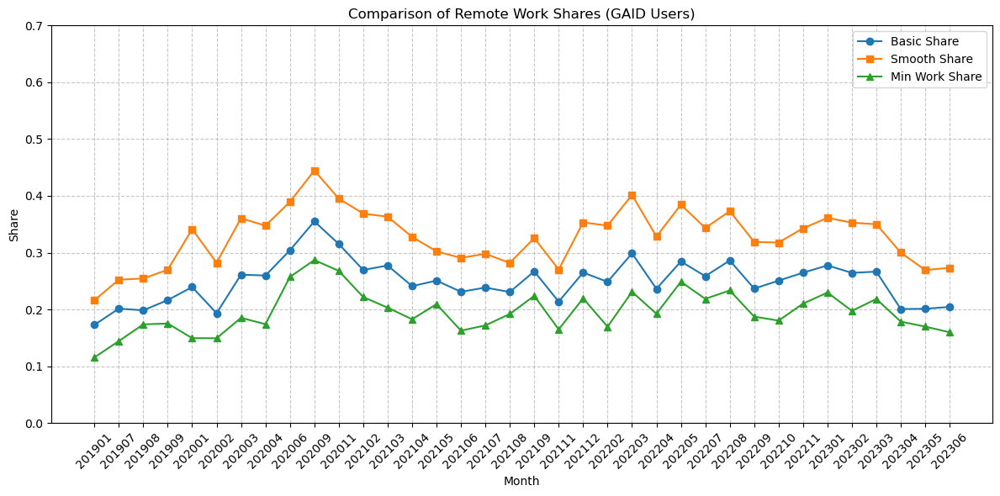


Detailed Statistics for GAID Users:
     month  remote_work_share  remote_work_share_smooth  remote_work_share_min_work
0   201901              0.173                     0.216                       0.115
1   201907              0.201                     0.252                       0.144
2   201908              0.198                     0.255                       0.174
3   201909              0.216                     0.270                       0.175
4   202001              0.239                     0.341                       0.149
5   202002              0.193                     0.282                       0.149
6   202003              0.261                     0.361                       0.185
7   202004              0.260                     0.347                       0.174
8   202006              0.304                     0.389                       0.257
9   202009              0.355                     0.445                       0.287
10  202011              0.315          

In [26]:
# Filter for GAID and calculate averages
avg_by_month_gaid = df_shares[(df_shares['identifier_type'] == 'GAID')&(~df_shares['month'].isin(excluded_months))].groupby('month').agg({
    'remote_work_share': 'mean',
    'remote_work_share_smooth': 'mean',
    'remote_work_share_min_work': 'mean'
}).reset_index()

# Create single plot comparing all share metrics
plt.figure(figsize=(12, 6))

# Plot each share metric
plt.plot(avg_by_month_gaid['month'], 
         avg_by_month_gaid['remote_work_share'], 
         marker='o', 
         label='Basic Share')
plt.plot(avg_by_month_gaid['month'], 
         avg_by_month_gaid['remote_work_share_smooth'], 
         marker='s', 
         label='Smooth Share')
plt.plot(avg_by_month_gaid['month'], 
         avg_by_month_gaid['remote_work_share_min_work'], 
         marker='^', 
         label='Min Work Share')

plt.title('Comparison of Remote Work Shares (GAID Users)', fontsize=12)
plt.xlabel('Month')
plt.ylabel('Share')
plt.grid(True, linestyle='--', alpha=0.7)
plt.ylim(0, 0.7)
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Print detailed statistics
print("\nDetailed Statistics for GAID Users:")
print(avg_by_month_gaid.round(3).to_string())

In [41]:
df_shares_dates = df_shares_dates.merge(df_shares.groupby("month").size().rename("total_users"), on='month')

In [42]:
df_shares_dates["remote_work_share"] = df_shares_dates["flag_remote_work"]/df_shares_dates["total_users"]

In [44]:
df_shares_dates["remote_work_share"].max()

0.38901531459499356

## Explore correlation between spikes and other monthly features

In [ ]:
columns_measures = df_shares.select_dtypes(["float","int"]).columns
df_shares[(df_shares['identifier_type'] == 'GAID')].groupby('month')[columns_measures ].mean().corr()

,Unnamed: 0,remote_work_days,total_work_days,remote_work_days_smooth,remote_work_days_min_work,remote_work_share,remote_work_share_smooth,remote_work_share_min_work
Unnamed: 0,1.000000,0.460976,0.395025,0.513361,0.471477,0.436910,0.515941,0.409021
remote_work_days,0.460976,1.000000,0.925956,0.989174,0.966021,0.888430,0.816154,0.758097
total_work_days,0.395025,0.925956,1.000000,0.921559,0.866721,0.691450,0.617277,0.554376
remote_work_days_smooth,0.513361,0.989174,0.921559,1.000000,0.945733,0.877288,0.848788,0.728495
remote_work_days_min_work,0.471477,0.966021,0.866721,0.945733,1.000000,0.869346,0.785735,0.859145
remote_work_share,0.436910,0.888430,0.691450,0.877288,0.869346,1.000000,0.948095,0.877361
remote_work_share_smooth,0.515941,0.816154,0.617277,0.848788,0.785735,0.948095,1.000000,0.800098
remote_work_share_min_work,0.409021,0.758097,0.554376,0.728495,0.859145,0.877361,0.800098,1.000000


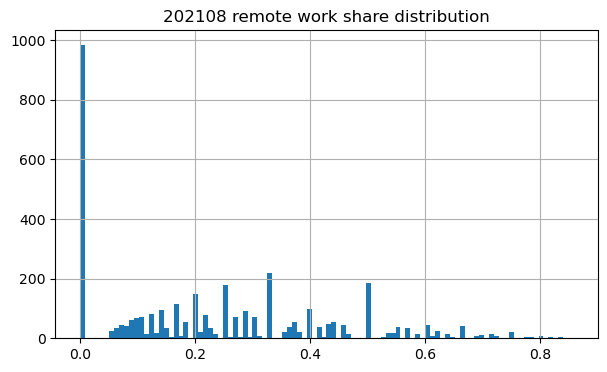

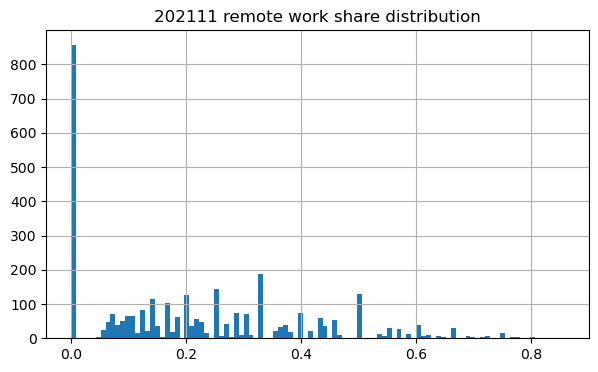

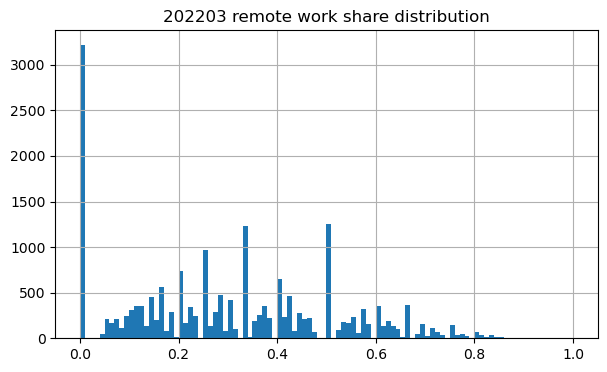

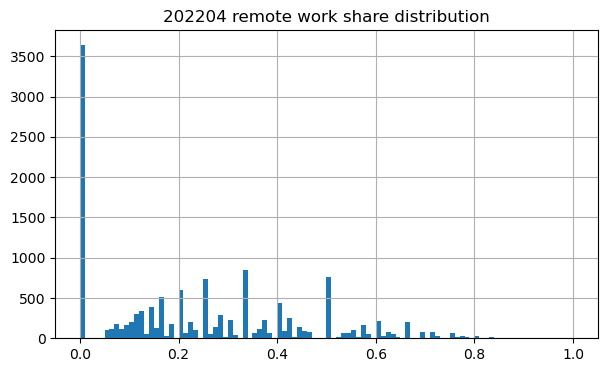

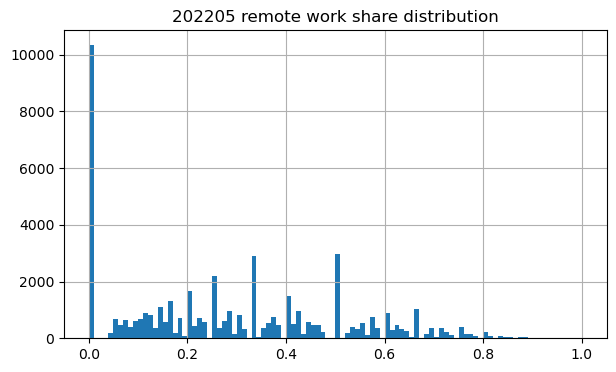

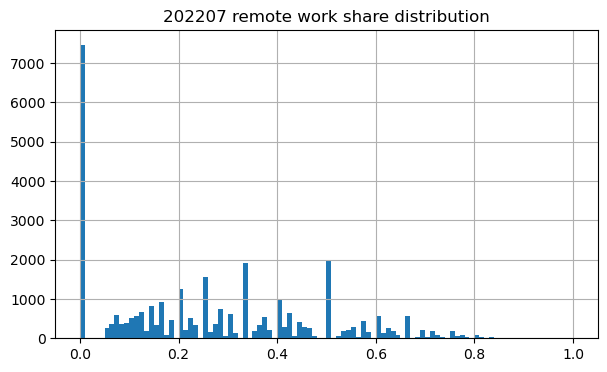

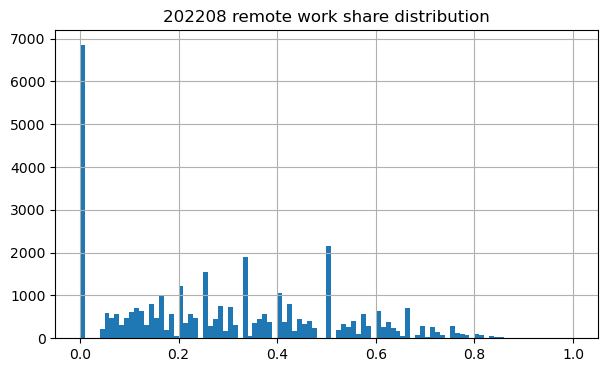

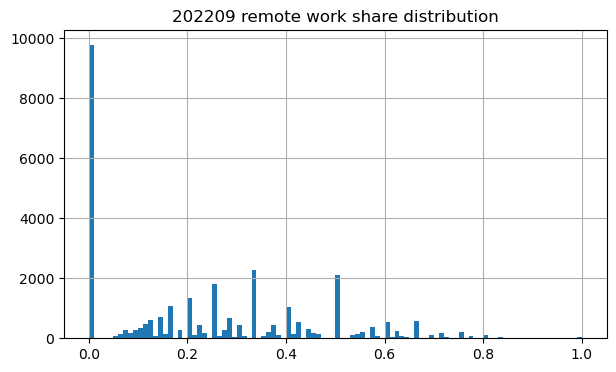

In [64]:
for MONTH in ['202108','202111','202203','202204','202205','202207','202208','202209']:
    plt.figure(figsize=(7,4))
    df_shares[(df_shares.month==MONTH)&(df_shares['identifier_type'] == 'GAID')]['remote_work_share'].hist(bins=100)
    plt.title(f"{MONTH} remote work share distribution")
    plt.show()

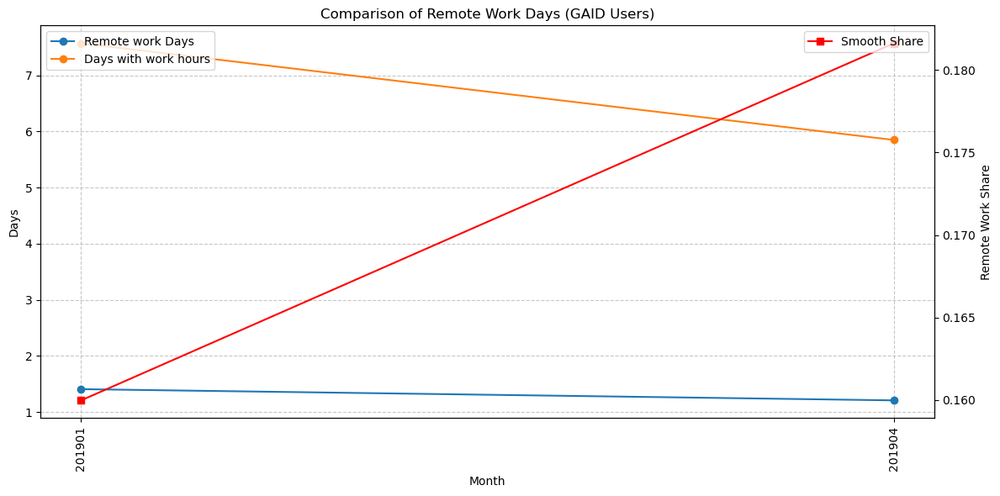

In [33]:
import matplotlib.pyplot as plt

# Create figure and axis
fig, ax1 = plt.subplots(figsize=(12, 6))

# Filter and group data
avg_by_month_gaid = df_shares[
    (df_shares['identifier_type'] == 'GAID') & (~df_shares['month'].isin(excluded_months))
].groupby('month')[['remote_work_days', 'total_work_days', 'remote_work_share_smooth']].mean().reset_index()

months_graph = avg_by_month_gaid.month.unique().tolist()

# First y-axis (left)
ax1.plot(avg_by_month_gaid['month'], 
         avg_by_month_gaid['remote_work_days'], 
         marker='o', 
         label='Remote work Days')

ax1.plot(avg_by_month_gaid['month'], 
         avg_by_month_gaid['total_work_days'], 
         marker='o', 
         label='Days with work hours')

ax1.set_xlabel('Month')
ax1.set_ylabel('Days')
ax1.grid(True, linestyle='--', alpha=0.7)

# Second y-axis (right)
ax2 = ax1.twinx()
ax2.plot(avg_by_month_gaid['month'], 
         avg_by_month_gaid['remote_work_share_smooth'], 
         marker='s', 
         color='red',
         label='Smooth Share')

ax2.set_ylabel('Remote Work Share')

# Title and legend
plt.title('Comparison of Remote Work Days (GAID Users)', fontsize=12)
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

ax1.set_xticklabels(labels = months_graph, rotation=90)
plt.tight_layout()
plt.show()


## In 2022 the bigger is number of days with individual work hours the higher is remote work. WHY?!

In [11]:
df_shares_dates["share_remote_work_hours"] = df_shares_dates["flag_remote_work"]/df_shares_dates["flag_work_hours"]

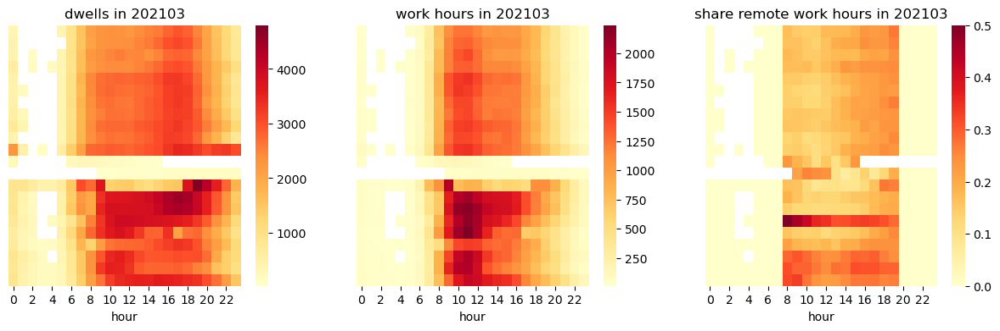

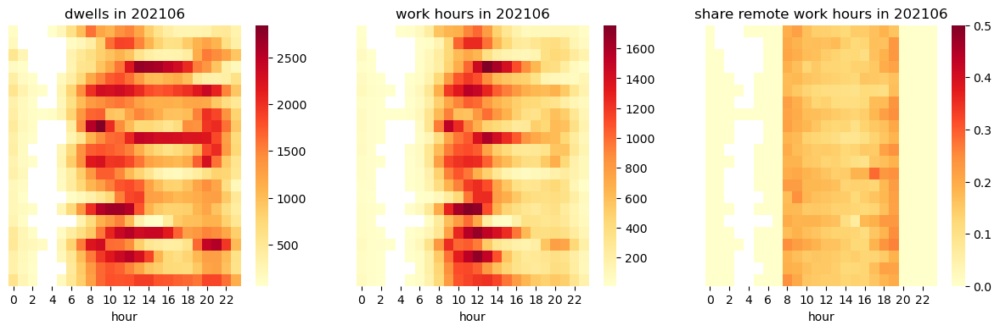

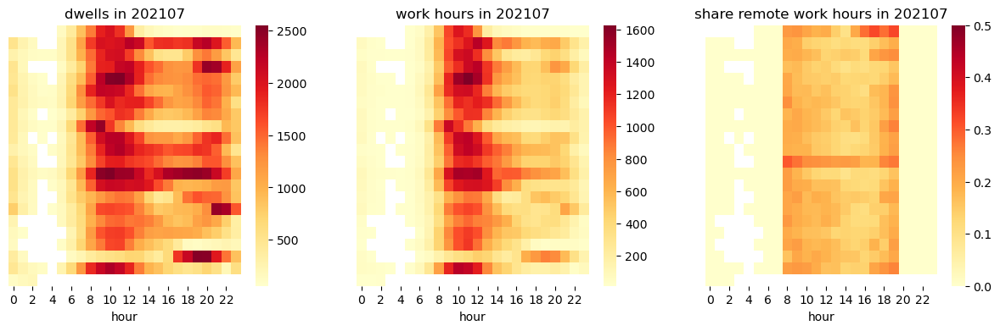

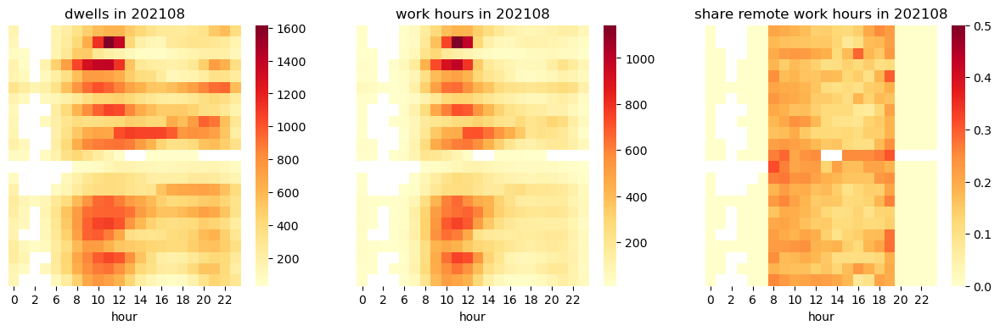

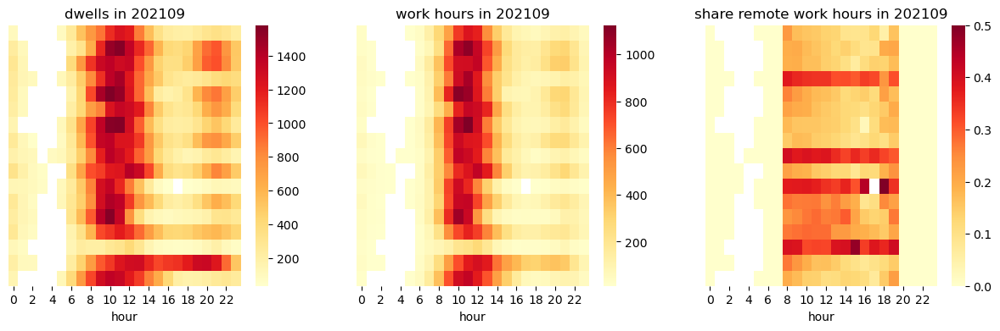

...

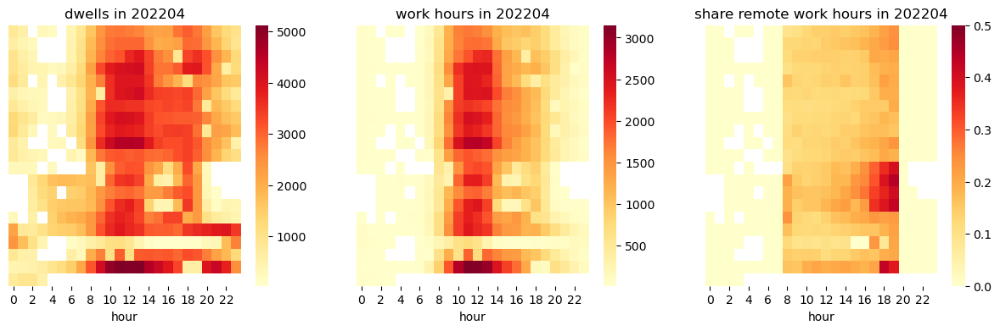

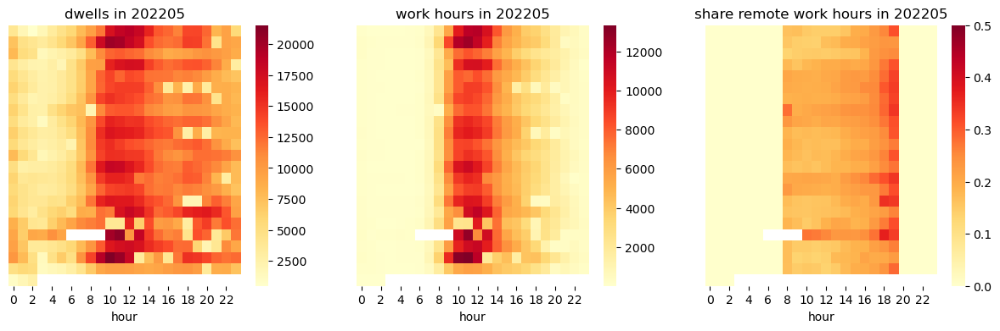

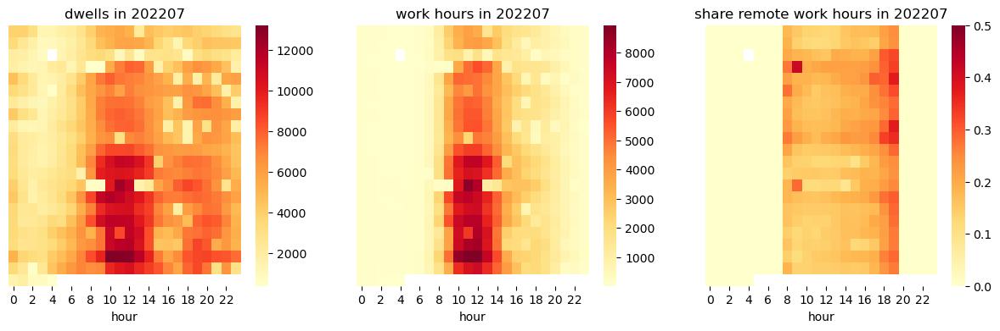

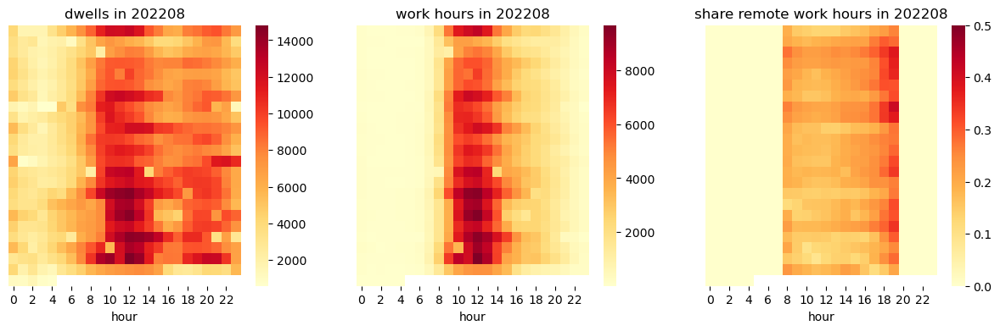

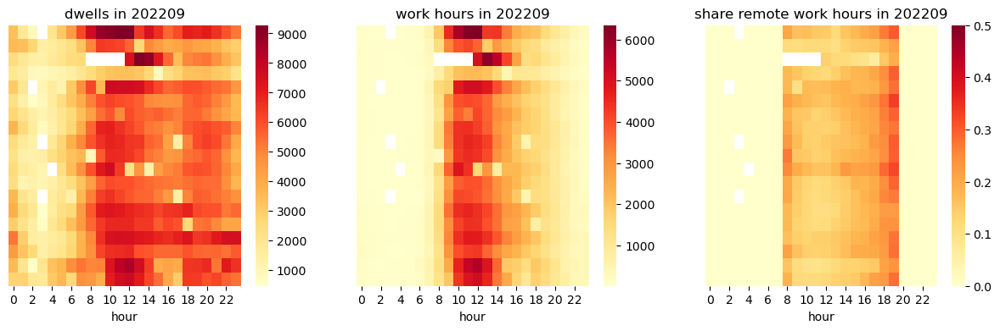

In [117]:
# basic approach for defining remote work

for MONTH in ['202103','202106','202107','202108','202109','202111','202202','202203','202204','202205','202207','202208','202209']:
    
    # Plot heatmap for GAID
    fig , ax = plt.subplots(1,3, figsize=(15, 4))
    sns.heatmap(pd.pivot(df_shares_dates[(df_shares_dates['month']==MONTH) & 
                                       (df_shares_dates['identifier_type']=='GAID')&
                                       (df_shares_dates.flag_work_hours>10)]
                        , index="date", columns="hour", values="count_dwells"), cmap="YlOrRd", ax=ax[0])
    ax[0].set_title(f'dwells in {MONTH}')
    ax[0].set_ylabel('')  # Remove y-axis label
    ax[0].set_yticks([])  # Remove y-axis ticks

    sns.heatmap(pd.pivot(df_shares_dates[(df_shares_dates['month']==MONTH) & 
                                       (df_shares_dates['identifier_type']=='GAID')&(df_shares_dates.flag_work_hours>10)]
                        , index="date", columns="hour", values="flag_work_hours"), cmap="YlOrRd", ax=ax[1])
    ax[1].set_title(f'work hours in {MONTH}')
    ax[1].set_ylabel('')  # Remove y-axis label
    ax[1].set_yticks([])  # Remove y-axis ticks

    heatmap_data = pd.pivot(df_shares_dates[(df_shares_dates['month'] == MONTH) & 
                                              (df_shares_dates['identifier_type'] == 'GAID') & 
                                              (df_shares_dates.flag_work_hours > 10)],
                             index="date", columns="hour", values="share_remote_work_hours")
    
    # Set the same heat scale for all heatmaps
    vmin = 0
    vmax = 0.5
    
    sns.heatmap(heatmap_data, cmap="YlOrRd", ax=ax[2], vmin=vmin, vmax=vmax)
    ax[2].set_title(f'share remote work hours in {MONTH}')
    ax[2].set_ylabel('')  # Remove y-axis label
    ax[2].set_yticks([])  # Remove y-axis ticks
    # No attribute set_clim, so we will remove this line
    plt.show()

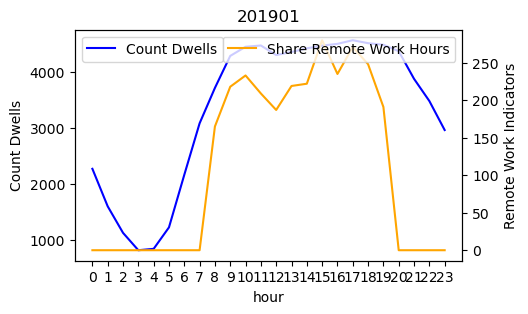

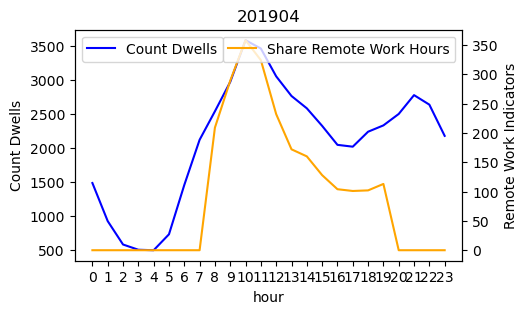

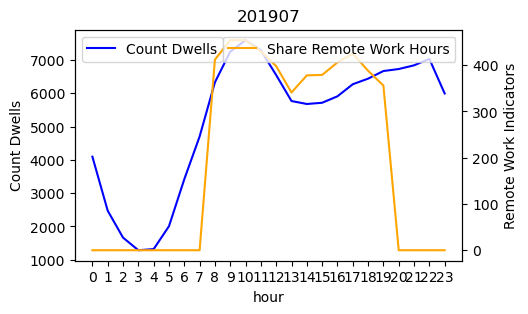

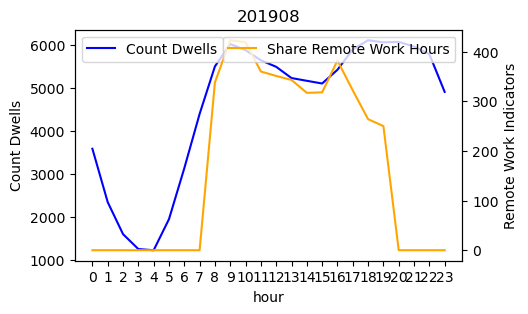

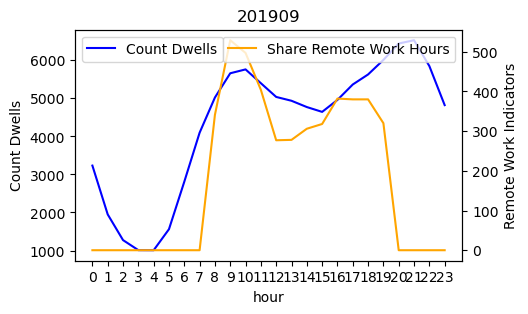

...

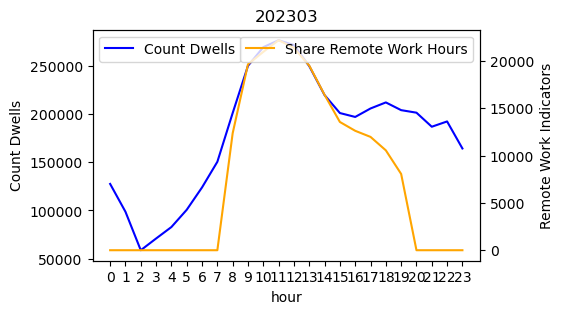

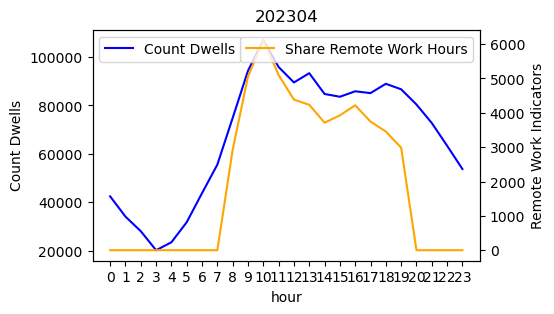

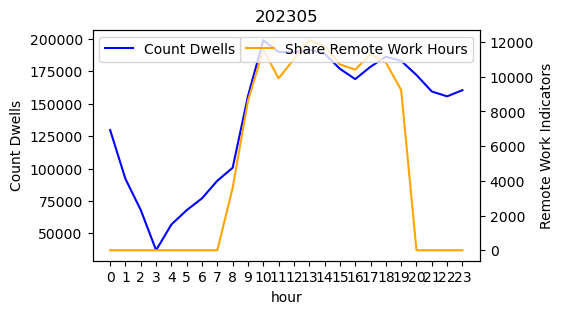

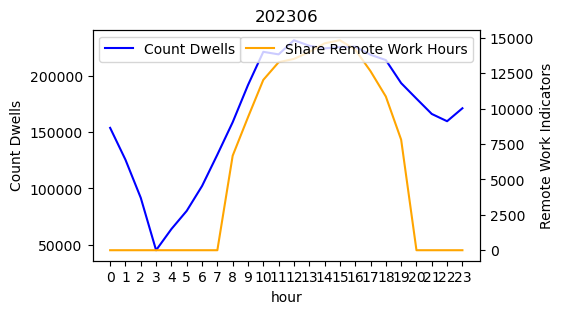

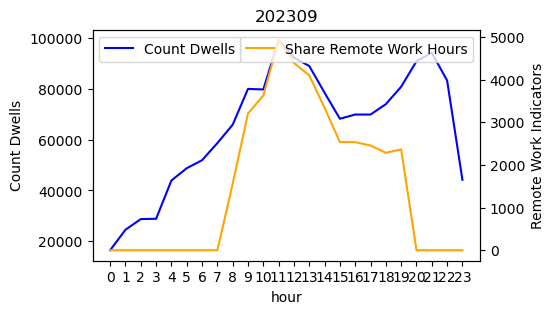

In [21]:
for MONTH in df_shares_dates.month.unique():#['202103','202106','202107','202108','202109','202111','202202','202203','202204','202205','202207','202208','202209']:
    
    # Plot heatmap for GAID
    fig, ax1 = plt.subplots(1, 1, figsize=(5, 3))
    df_shares_dates[(df_shares_dates['month'] == MONTH) & 
                    (df_shares_dates['identifier_type'] == 'GAID')].groupby("hour")["count_dwells"].sum().plot(ax=ax1, color='blue', label='Count Dwells')
    
    ax2 = ax1.twinx()  # Create a second y-axis
    df_shares_dates[(df_shares_dates['month'] == MONTH) & 
                    (df_shares_dates['identifier_type'] == 'GAID')].groupby("hour")["share_remote_work_hours"].sum().plot(ax=ax2, color='orange', label='Count Remote Work Hours')
    
    ax1.set_title(MONTH)
    ax1.set_ylabel('Count Dwells')
    ax2.set_ylabel('Remote Work Indicators')
    ax1.set_xticks(range(0, 24))  # Set x-ticks range from 0 to 23
    ax1.legend(loc='upper left')
    ax2.legend(loc='upper right')
    plt.show()

## Looking at the hours with very high remote work share we found very low number of signals at these hours 

In [69]:
df_shares_dates[(df_shares_dates.share_remote_work_hours>0.5) & 
                                       (df_shares_dates['identifier_type']=='GAID')]


,Unnamed: 0,date,hour,identifier_type,flag_remote_work,flag_work_hours,count_dwells,month,share_remote_work_hours
402,402,2019-04-09,9,GAID,9,14,42,201904,0.642857
404,404,2019-04-09,10,GAID,11,19,47,201904,0.578947
406,406,2019-04-09,11,GAID,12,20,41,201904,0.600000
992,992,2019-04-21,18,GAID,2,2,12,201904,1.000000
994,994,2019-04-21,19,GAID,2,2,12,201904,1.000000
...,...,...,...,...,...,...,...,...,...
955,955,2023-09-21,14,GAID,3,4,10,202309,0.750000
961,961,2023-09-21,17,GAID,4,7,15,202309,0.571429
963,963,2023-09-21,18,GAID,3,5,15,202309,0.600000
1063,1063,2023-09-24,15,GAID,5,6,15,202309,0.833333


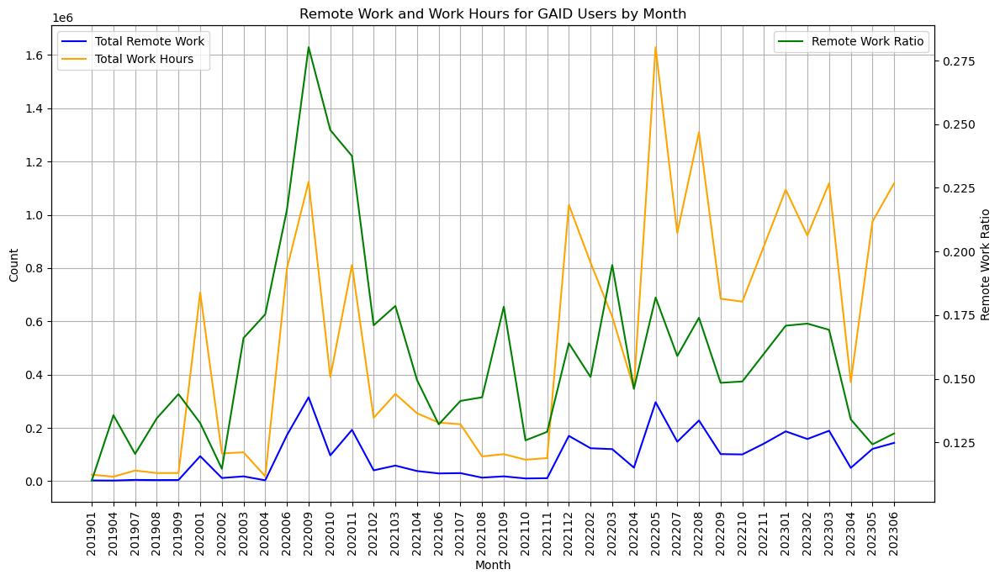

In [107]:
# Plot total remote work and total work hours for GAID users by month
filter = (df_shares_dates['identifier_type'] == 'GAID')&(~df_shares_dates['month'].isin(excluded_months))
plt.figure(figsize=(12,7))
ax1 = df_shares_dates[filter].groupby('month')["flag_remote_work"].sum().plot(label='Total Remote Work', color='blue')

# Plot total work hours for GAID users by month
df_shares_dates[filter].groupby('month')["flag_work_hours"].sum().plot(ax=ax1, label='Total Work Hours', color='orange')

# Create a second y-axis
ax2 = ax1.twinx()

# Plot the ratio of remote work to total work hours on the second y-axis
df_shares_dates[filter].groupby('month').apply(
    lambda x: sum(x["flag_remote_work"]) / sum(x["flag_work_hours"])
).plot(ax=ax2, label='Remote Work Ratio', color='green')

# Adding labels and title for clarity
plt.title('Remote Work and Work Hours for GAID Users by Month')
ax1.set_xlabel('Month')
ax1.set_ylabel('Count')
ax2.set_ylabel('Remote Work Ratio')
# Set x-ticks and labels
ax1.set_xticks(range(len(df_shares_dates[filter]['month'].unique())))  # Set the number of ticks
ax1.set_xticklabels(df_shares_dates[filter]['month'].unique(), rotation=90)  # Set the labels

ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
ax1.grid(True)
plt.tight_layout()
plt.show()

## Add hours restrictions: 8-14

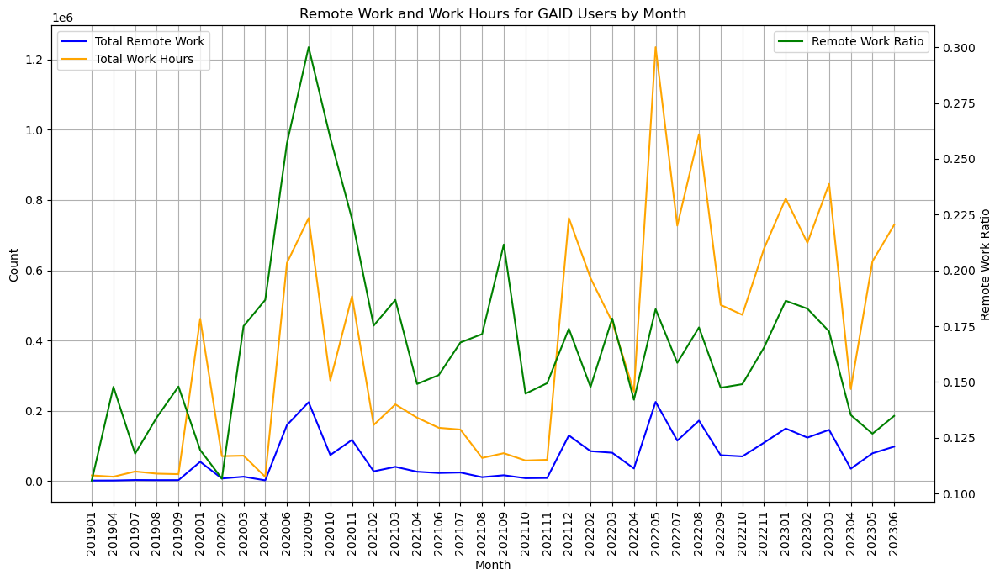

In [118]:
# Plot total remote work and total work hours for GAID users by month
filter = (df_shares_dates['identifier_type'] == 'GAID')&(~df_shares_dates['month'].isin(excluded_months))
filter = filter & (df_shares_dates['hour']<=15) & (df_shares_dates['hour']>=8)
plt.figure(figsize=(12,7))
ax1 = df_shares_dates[filter].groupby('month')["flag_remote_work"].sum().plot(label='Total Remote Work', color='blue')

# Plot total work hours for GAID users by month
df_shares_dates[filter].groupby('month')["flag_work_hours"].sum().plot(ax=ax1, label='Total Work Hours', color='orange')

# Create a second y-axis
ax2 = ax1.twinx()

# Plot the ratio of remote work to total work hours on the second y-axis
df_shares_dates[filter].groupby('month').apply(
    lambda x: sum(x["flag_remote_work"]) / sum(x["flag_work_hours"])
).plot(ax=ax2, label='Remote Work Ratio', color='green')

# Adding labels and title for clarity
plt.title('Remote Work and Work Hours for GAID Users by Month')
ax1.set_xlabel('Month')
ax1.set_ylabel('Count')
ax2.set_ylabel('Remote Work Ratio')
# Set x-ticks and labels
ax1.set_xticks(range(len(df_shares_dates[filter]['month'].unique())))  # Set the number of ticks
ax1.set_xticklabels(df_shares_dates[filter]['month'].unique(), rotation=90)  # Set the labels

ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
ax1.grid(True)
plt.tight_layout()
plt.show()

## Filter out erev hugs

In [119]:
import holidays
israel_holidays = holidays.country_holidays("IL", years=2019)

In [124]:
import holidays
from datetime import timedelta
one_day_before_holidays = []
for year in range(2019,2024):
    israel_holidays = holidays.country_holidays("IL", years=year)
    one_day_before_holidays = one_day_before_holidays+[date - timedelta(days=1) for date in israel_holidays.keys()]

In [127]:
one_day_before_holidays_str = [date.strftime('%Y-%m-%d') for date in one_day_before_holidays]

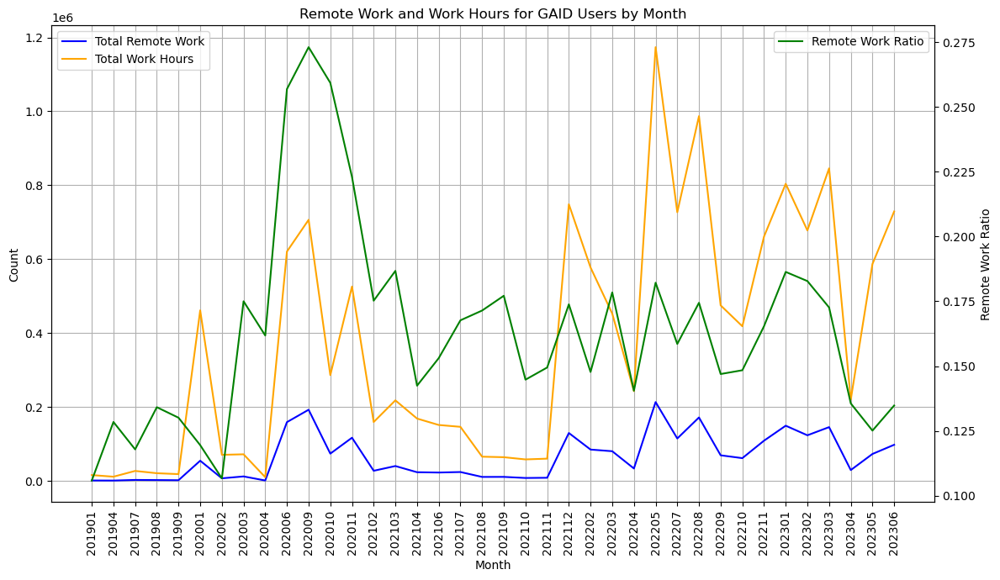

In [128]:
# Plot total remote work and total work hours for GAID users by month
filter = (df_shares_dates['identifier_type'] == 'GAID')&(~df_shares_dates['month'].isin(excluded_months))
filter = filter & (df_shares_dates['hour']<=15) & (df_shares_dates['hour']>=8) &(~df_shares_dates['date'].isin(one_day_before_holidays_str))
plt.figure(figsize=(12,7))
ax1 = df_shares_dates[filter].groupby('month')["flag_remote_work"].sum().plot(label='Total Remote Work', color='blue')

# Plot total work hours for GAID users by month
df_shares_dates[filter].groupby('month')["flag_work_hours"].sum().plot(ax=ax1, label='Total Work Hours', color='orange')

# Create a second y-axis
ax2 = ax1.twinx()

# Plot the ratio of remote work to total work hours on the second y-axis
df_shares_dates[filter].groupby('month').apply(
    lambda x: sum(x["flag_remote_work"]) / sum(x["flag_work_hours"])
).plot(ax=ax2, label='Remote Work Ratio', color='green')

# Adding labels and title for clarity
plt.title('Remote Work and Work Hours for GAID Users by Month')
ax1.set_xlabel('Month')
ax1.set_ylabel('Count')
ax2.set_ylabel('Remote Work Ratio')
# Set x-ticks and labels
ax1.set_xticks(range(len(df_shares_dates[filter]['month'].unique())))  # Set the number of ticks
ax1.set_xticklabels(df_shares_dates[filter]['month'].unique(), rotation=90)  # Set the labels

ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
ax1.grid(True)
plt.tight_layout()
plt.show()

## Explore correlation between spikes and other features

In [ ]:
columns_measures = df_shares.select_dtypes(["float","int"]).columns
df_shares[(df_shares['identifier_type'] == 'GAID')].groupby('month')[columns_measures ].mean().corr()

,Unnamed: 0,remote_work_days,total_work_days,remote_work_days_smooth,remote_work_days_min_work,remote_work_share,remote_work_share_smooth,remote_work_share_min_work
Unnamed: 0,1.000000,0.460976,0.395025,0.513361,0.471477,0.436910,0.515941,0.409021
remote_work_days,0.460976,1.000000,0.925956,0.989174,0.966021,0.888430,0.816154,0.758097
total_work_days,0.395025,0.925956,1.000000,0.921559,0.866721,0.691450,0.617277,0.554376
remote_work_days_smooth,0.513361,0.989174,0.921559,1.000000,0.945733,0.877288,0.848788,0.728495
remote_work_days_min_work,0.471477,0.966021,0.866721,0.945733,1.000000,0.869346,0.785735,0.859145
remote_work_share,0.436910,0.888430,0.691450,0.877288,0.869346,1.000000,0.948095,0.877361
remote_work_share_smooth,0.515941,0.816154,0.617277,0.848788,0.785735,0.948095,1.000000,0.800098
remote_work_share_min_work,0.409021,0.758097,0.554376,0.728495,0.859145,0.877361,0.800098,1.000000


<Axes: xlabel='month'>

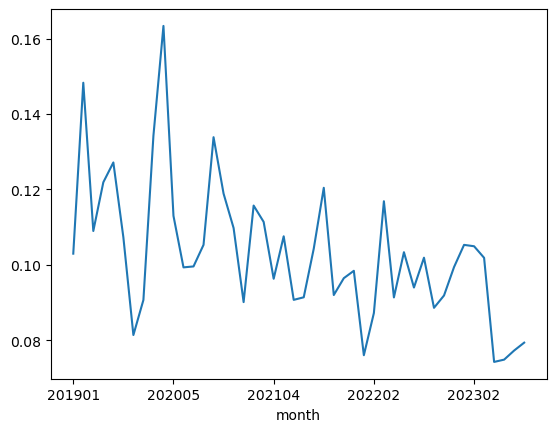

In [71]:
df_shares_dates[(df_shares_dates.flag_work_hours>10) & 
                                       (df_shares_dates['identifier_type']=='GAID')].groupby('month')['share_remote_work_hours'].mean().plot()

In [22]:
months = ['201901','201904']
list_months = []
for MONTH in months:
    print(MONTH)
    try:
        df_part = pd.read_csv(
            utils.get_path(
                "processed", "dwells", f"remote_work/user_remote_work_{MONTH}.csv"
            )
        )
        df_part["month"] = MONTH
        list_months.append(df_part)
    except:
        pass

201901
201904


In [23]:
df_shares = pd.concat(list_months)

In [27]:
df_shares.columns

Index(['Unnamed: 0', 'identifier', 'identifier_type', 'remote_work_days',
       'total_work_days', 'remote_work_days_smooth',
       'remote_work_days_min_work', 'flag_remote_work_smoothed_max',
       'flag_remote_work_smoothed_max_thresh', 'remote_work_share',
       'remote_work_share_smooth', 'remote_work_share_min_work', 'month'],
      dtype='object')

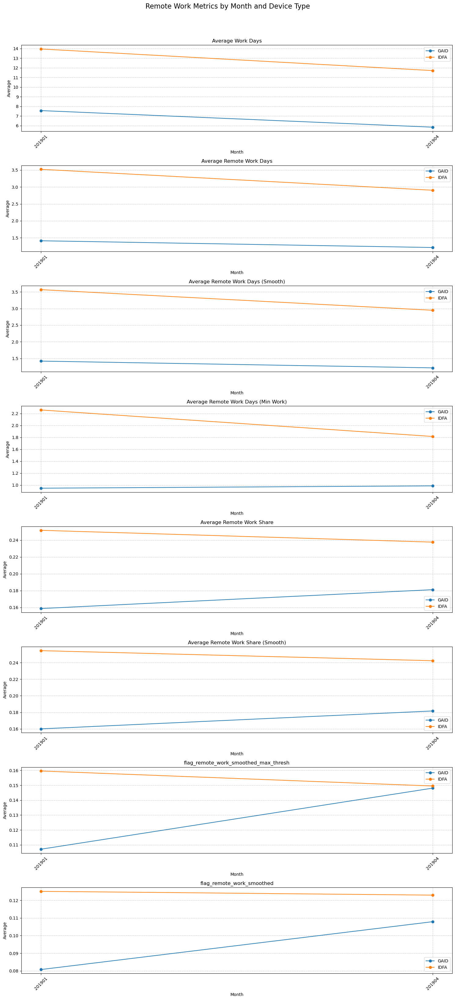


Detailed Statistics:
    month identifier_type  total_work_days  remote_work_days  remote_work_days_smooth  remote_work_days_min_work  remote_work_share  remote_work_share_smooth  remote_work_share_min_work  flag_remote_work_smoothed_max_thresh  flag_remote_work_smoothed_max
0  201901            GAID            7.568             1.410                    1.422                      0.948              0.159                     0.160                       0.107                                 0.107                          0.081
1  201901            IDFA           13.956             3.522                    3.566                      2.258              0.252                     0.255                       0.160                                 0.160                          0.125
2  201904            GAID            5.848             1.210                    1.219                      0.987              0.181                     0.182                       0.148                            

In [30]:
import seaborn as sns
# Calculate averages for all numeric columns
avg_by_month_type = df_shares.groupby(['month', 'identifier_type']).agg({
    'total_work_days': 'mean',
    'remote_work_days': 'mean',
    'remote_work_days_smooth': 'mean',
    'remote_work_days_min_work': 'mean',
    'remote_work_share': 'mean',
    'remote_work_share_smooth': 'mean',
    'remote_work_share_min_work': 'mean',
    'flag_remote_work_smoothed_max_thresh': 'mean',
    'flag_remote_work_smoothed_max': 'mean'
}).reset_index()

# Create visualization for all metrics
metrics = [
    ('total_work_days', 'Average Work Days'),
    ('remote_work_days', 'Average Remote Work Days'),
    ('remote_work_days_smooth', 'Average Remote Work Days (Smooth)'),
    ('remote_work_days_min_work', 'Average Remote Work Days (Min Work)'),
    ('remote_work_share', 'Average Remote Work Share'),
    ('remote_work_share_smooth', 'Average Remote Work Share (Smooth)'),
    ("flag_remote_work_smoothed_max_thresh", "flag_remote_work_smoothed_max_thresh"),
    ("flag_remote_work_smoothed_max", "flag_remote_work_smoothed")
]

fig, axes = plt.subplots(len(metrics), 1, figsize=(15, 4*len(metrics)))
fig.suptitle('Remote Work Metrics by Month and Device Type', fontsize=16, y=1.02)

for i, (metric, title) in enumerate(metrics):
    for device_type in avg_by_month_type['identifier_type'].unique():
        data = avg_by_month_type[avg_by_month_type['identifier_type'] == device_type]
        axes[i].plot(data['month'], data[metric], marker='o', label=device_type)
    
    axes[i].set_title(title)
    axes[i].set_xlabel('Month')
    axes[i].set_ylabel('Average')
    axes[i].grid(True, linestyle='--', alpha=0.7)
    axes[i].legend()
    axes[i].tick_params(axis='x', rotation=45)
    
plt.tight_layout()
plt.show()

# Print detailed statistics
print("\nDetailed Statistics:")
print(avg_by_month_type.round(3).to_string())